# **Deep Learning for Artificial Intelligence Project**

**Group members**:

* Matteo Gerevini - 5411210
* Lorenzo Meroni - 5410127




# **Goal**

The following project addresses the challenge of automated surface defect classification in leather manufacturing by comparing two fundamentally opposed Deep Learning paradigms.

* **Supervised Approach:** A fully supervised **Custom ResNet-18**, optimized to directly extract discriminative features from labeled data.
* **Hybrid Pipeline:** An innovative approach utilizing a **Fully Convolutional Autoencoder**. The model first undergoes unsupervised pre-training to capture complex leather morphology through spatial reconstruction. The resulting latent space is then specialized for classification via **Transfer Learning** and precise end-to-end **Fine-Tuning**.

This comparative analysis aims to evaluate the trade-offs between a native classifier and the discriminative potential of a reconstructive, unsupervised feature space.

# **Libraries**

In [ ]:
import os
import shutil
from google.colab import drive
from torchvision.datasets import ImageFolder
from collections import Counter
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import torch
from torch.utils.data import random_split
from torchvision import transforms
from torch.utils.data import Dataset
import torch.nn as nn
import torch.optim as optim
import time
import copy
import json
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import pandas as pd
import torch.nn.functional as F

> **Setting the GPU**

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

Device: cuda


# **Data Loading and Description**

Leather Defect Classification Dataset: https://www.kaggle.com/datasets/praveen2084/leather-defect-classification


In [ ]:
drive.mount('/content/drive')

path_MG = '/content/drive/MyDrive/00gerem00/DL-AI-Project'
path_LM = '/content/drive/MyDrive/lorenzomeroni02/DL-AI-Project'

working_dir = path_MG if os.path.exists(path_MG) else path_LM if os.path.exists(path_LM) else None

if working_dir:
    os.chdir(working_dir)
    print(f"Working directory established: {working_dir}")
    os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive"
else:
    print("Error: Project directory not found.")

dataset_api_name = 'praveen2084/leather-defect-classification'
zip_filename = 'leather-defect-classification.zip'
fast_local_dir = '/content/fast_dataset'

if working_dir:
    # Kaggle Download Section
    if os.path.exists(zip_filename):
        print(f"Found '{zip_filename}' in Drive. Bypassing Kaggle download.")
    else:
        print(f"ZIP not found on Drive. Downloading '{dataset_api_name}' from Kaggle.")
        !kaggle datasets download -d {dataset_api_name} -q
        print("Download completed. ZIP file safely stored on Drive.")

    if os.path.exists(fast_local_dir):
        print(f"Local environment '{fast_local_dir}' already provisioned. Bypassing extraction.")
    else:
        print("Extracting dataset to fast local SSD")
        os.makedirs(fast_local_dir, exist_ok=True)
        !unzip -q {zip_filename} -d {fast_local_dir}

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Working directory established: /content/drive/MyDrive/00gerem00/DL-AI-Project
Found 'leather-defect-classification.zip' in Drive. Bypassing Kaggle download.
Local environment '/content/fast_dataset' already provisioned. Bypassing extraction.


In [ ]:
base_dir = '/content/fast_dataset'

content = os.listdir(base_dir)
subfolders = [f for f in content if os.path.isdir(os.path.join(base_dir, f))][0]
data_dir = os.path.join(base_dir, subfolders)

dataset = ImageFolder(
    root = data_dir,
    transform = None)

print(f"Total number of images: {len(dataset)}")
print(f"Classes found: {dataset.classes}")
print(f"Index mapping: {dataset.class_to_idx}")

Total number of images: 3600
Classes found: ['Folding marks', 'Grain off', 'Growth marks', 'loose grains', 'non defective', 'pinhole']
Index mapping: {'Folding marks': 0, 'Grain off': 1, 'Growth marks': 2, 'loose grains': 3, 'non defective': 4, 'pinhole': 5}


We successfully connected the project to the image library, identifying a total of 3,600 images. These images are organized into six distinct categories representing different types of leather quality and defects: *Folding marks*, *Grain off*, *Growth marks*, *loose grains*, *non defective* and *pinhole*.

Before proceeding with the Exploratory Data Analysis, we perform a comprehensive scan of the physical files stored on the local environment. The goal is to validate the structural homogeneity of the dataset. These lines of code iterate through every image to extract its pixel dimensions and its color mode.

In [ ]:
size_counter = Counter()
color_modes = set()

for path, _ in dataset.samples:
    with Image.open(path) as img:
        size_counter[img.size] += 1
        color_modes.add(img.mode)

print("\nSize Report:")
for size, count in size_counter.items():
    print(f" - {size[0]}x{size[1]} pixel: {count} images")

print(f"\nColor Mode: {color_modes}")


Size Report:
 - 227x227 pixel: 3598 images
 - 4608x3288 pixel: 2 images

Color Mode: {'RGB'}


This audit allowed us to identify two outlier images with giant resolutions that differed from the dominating $227 \times 227$ format.

Instead of modifying the raw files on Google Drive, which preserves data integrity for future use, we perform an in-memory filtering of the PyTorch dataset object.
* Dynamic Filtering: We redefine dataset.samples using a list comprehension that opens each image and validates its dimensions. Only images that are exactly $227 \times 227$ pixels are retained. This effectively drops the 2 giant outliers from the current session.
* Redundancy Alignment: In PyTorch, ImageFolder maintains an internal list called imgs which is a legacy duplicate of samples. To ensure full compatibility with all PyTorch utility functions and data loaders, we explicitly synchronize dataset.imgs with our filtered list.
* Target Alignment: A common pitfall in PyTorch is that the samples list (file paths) and the targets list (class labels) are stored separately. This cell explicitly re-synchronizes the dataset.targets to match the filtered samples.

By performing this at the object level, we ensure that every subsequent analysis and the training process itself only see the 3598 valid images, providing a clean and consistent input space for our tasks.

In [ ]:
dataset.samples = [s for s in dataset.samples if Image.open(s[0]).size == (227, 227)]
dataset.imgs = dataset.samples
dataset.targets = [s[1] for s in dataset.samples]
print(f"{len(dataset)} images")

3598 images


# **Exploratory Data Analysis**
In this section, we visualize the Class Distribution of the leather dataset by plotting the classes histogram. The purpose of this visualization is to ensure the dataset is balanced.

The final dataset distribution is shown in the figure below. After removing two dimensional outliers, each of the six classes remains almost perfectly balanced, with *Folding marks*, *Growth marks*, *loose grains* and *non defective* classes containing 600 images, while *Grain off* and *pinhole* classes containing 599 images. This minimal difference does not introduce any relevant class imbalance and therefore does not require additional resampling or weighting strategies. The dataset can be considered effectively balanced for training and evaluation purposes.

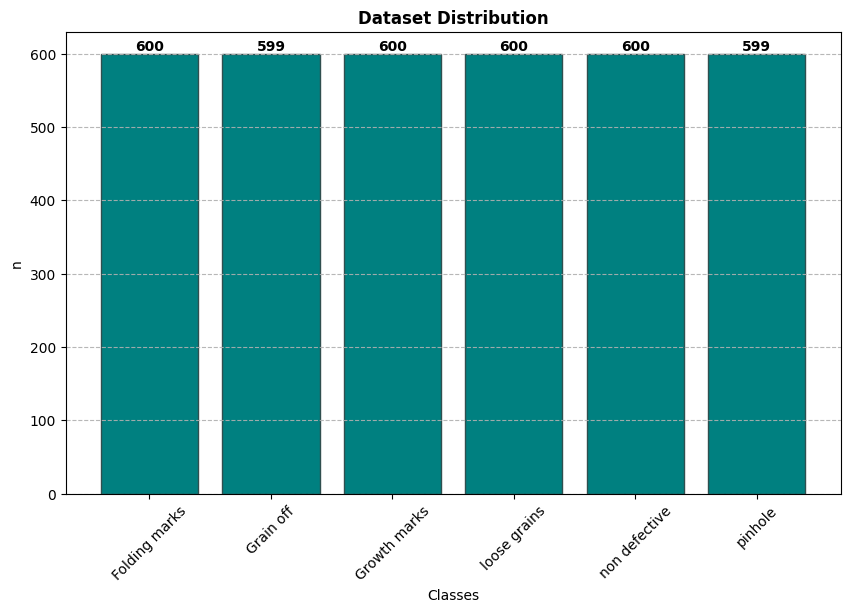

In [ ]:
labels = dataset.targets
counts = Counter(labels)

class_names = dataset.classes
distribution = {class_names[idx]: count for idx, count in counts.items()}

plt.figure(figsize=(10, 6))
plt.bar(distribution.keys(), distribution.values(), color='teal', edgecolor='darkslategrey')
plt.xlabel('Classes')
plt.ylabel('n')
plt.title('Dataset Distribution', fontweight='bold')
plt.xticks(rotation = 45)
plt.grid(axis = 'y', linestyle = '--', alpha = 0.9)

for i, v in enumerate(distribution.values()):
    plt.text(i, v + 5, str(v), ha='center', fontweight='bold')

plt.show()

Then we perform a Visual Inspection of the dataset. While the previous steps focused on hidden data like file sizes and class counts, this step is about looking at the actual content of the dataset.
The goal of this visualization is to get a first-hand look at the leather samples to understand the complexity of the task. By selecting images at random, we get an unbiased view of the data.

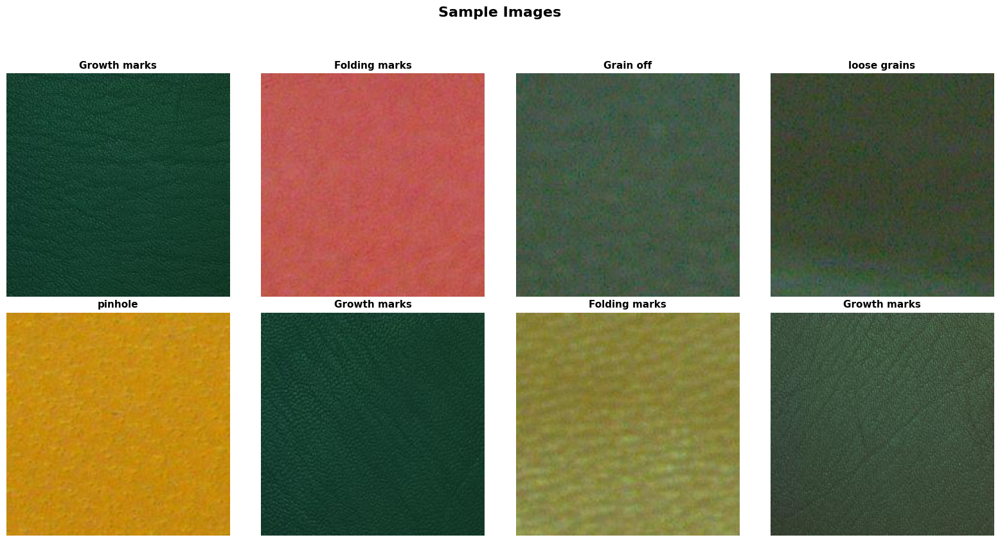

In [ ]:
num_images = 8
random_indices = random.sample(range(len(dataset)), num_images)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle("Sample Images", fontsize=16, fontweight='bold', y=1.05)

axes = axes.flatten()

for i, idx in enumerate(random_indices):
    img, label = dataset[idx]

    axes[i].imshow(img)
    axes[i].set_title(dataset.classes[label], fontsize=11, fontweight='bold')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

The figure shows randomly selected sample images from the dataset. A visual inspection indicates that the classification problem is primarily texture-based. The different classes exhibit subtle variations in surface patterns and structural irregularities, while color differences are not consistently associated with specific defect categories.

# **Model 1: Custom ResNet-18**

The first model developed in our project is based on a ResNet-18 architecture, which was specifically implemented and adapted to tackle the problem at hand. The primary goal of this phase is the supervised classification of surface defects in industrial leather. Within the overall scope of the project, this first architecture plays a crucial role as our structured baseline model. Since it is trained in a fully supervised manner, from the raw image pixels all the way to the output of class probabilities, the ResNet-18 sets our quantitative and qualitative performance standard. These results will serve as the benchmark for the subsequent phase of our research, which aims to evaluate whether the alternative approach, based on unsupervised feature extraction via an autoencoder combined with transfer learning principles, can get close to the diagnostic capabilities of a standard deep convolutional network.

## **Data Preprocessing & DataLoader**

First of all, to prepare the dataset for training we decide to split it in train, validation and test set. Specifically, 70% of the data is allocated to the training set. The remaining 30% is divided equally between the validation and test sets. The validation set is actively used at the end of each epoch to monitor the model's generalization capabilities and prevent overfitting, while the test set is kept strictly isolated until the very end. This ensures an completely unbiased final evaluation of the model's accuracy.

In [ ]:
train_size = int(0.7 * len(dataset))
val_size = (len(dataset) - train_size) // 2
test_size = len(dataset) - train_size - val_size

train_set, val_set, test_set = random_split(
    dataset,
    [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(42)
)

print(f"Completed split: {len(train_set)} training set, {len(val_set)} validation set, {len(test_set)} test set")

Completed split: 2518 training set, 540 validation set, 540 test set


Then we The `TransformSubset` Wrapper is used to apply preprocessing steps after the random dataset splitting. This ensures us to have each set applied the desired transormation without altering the underlying dataset structure.

In [ ]:
class TransformSubset(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform

    def __getitem__(self, index):
        x, y = self.subset[index]
        if self.transform:
            x = self.transform(x)
        return x, y

    def __len__(self):
        return len(self.subset)

The goal of the training pipeline `train_transform` is Data Augmentation to artificially increase the diversity of the training set without collecting new data. In our leather defect classification task, it serves two main purposes:

1. Increasing Variability: It helps the model capture defects from multiple angles and under various lighting conditions, compensating for the fact that the images in our training set ($2518$) might not cover every real world scenario.
2. Regularization and Preventing Overfitting: By presenting a slightly different version of the same image in each epoch, we prevent the network from "memorizing" specific pixel patterns (noise). Instead, we force it to focus on robust, invariant structural and chromatic features of the defects (*folding marks, pinholes, etc.*).

These are the operations we applied:
* `transforms.Resize((230, 230))`: Starting from original $227 \times 227$ images, we upscale them to $230 \times 230$. Since it is impossible to create new data out of thin air, the system uses bilinear interpolation. The algorithm analyzes the original pixel grid and, as it stretches the image, fills the resulting gaps by calculating a weighted average of adjacent pixels.

* `transforms.RandomCrop((224, 224))`: We randomly cut out a $224 \times 224$ square from the $230 \times 230$ image. This teaches the model spatial invariance. It learns to recognize a defect whether it is perfectly in the center or slightly off to the edge.

* `transforms.RandomHorizontalFlip(p=0.5)`: There is a 50% probability the image will be flipped like a mirror. A scratch or a pinhole is still a defect regardless of whether it points left or right.

* `transforms.RandomRotation(15)`: We rotate the image by a random angle between -15 and +15 degrees. This simulates variations in how the camera or the leather might have been positioned on the factory line.

* `transforms.ColorJitter(brightness=0.15, contrast=0.12)`: This randomly alters the lighting. It prevents the model from relying on a specific factory lighting condition, making it robust against brighter or darker environments.

* `transforms.ToTensor()`: It does not merely change the data type. It reshapes the raw image from a spatial format (Height $\times$ Width $\times$ Channels) with pixel intensities in the [0, 255] range, into a PyTorch compatible Tensor (Channels $\times$ Height $\times$ Width), scaling the values down to a [0.0, 1.0] float range for numerical stability.

* `transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])`: It takes the [0.0, 1.0] tensor and applies normalization using a mean and standard deviation of $0.5$ across all three RGB channels.: $z = \frac{x_{c} - 0.5}{0.5}$ . This operation maps the data to an exact [-1.0, 1.0] range. The zero-centered distribution ensures numerical stability and faster gradient convergence during backpropagation.

Moreover, we apply training `mean` and `std` to both validation and test sets, since they must be normalized using the exact empirical mean and standard deviation computed exclusively from the training set. This ensures Feature Space Consistency: the neural network optimizes its weights based on the specific mathematical distribution of the training data; applying different normalization parameters to the test data would shift this distribution and invalidate the model's learned weights.


In [ ]:
train_transform = transforms.Compose([
    transforms.Resize((230, 230)),
    transforms.RandomCrop((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.15, contrast=0.12),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

train_final = TransformSubset(train_set, transform=train_transform)
val_final = TransformSubset(val_set, transform=val_test_transform)
test_final = TransformSubset(test_set, transform=val_test_transform)

`DataLoaders` are created, which are essential tools for optimizing the data flow to the neural network. These components manage mini-batching by grouping images into blocks of 32 samples, obtaining gradient stability and computational efficiency.

The shuffle feature is enabled exclusively for the training set, reordering the images at each epoch to prevent the model from memorizing sequences and forcing it to recognize the actual visual patterns of leather defects. Conversely, validation and test data are loaded deterministically and sequentially, ensuring a rigorous evaluation and the accurate generation of the final confusion matrix through data unaltered by stochastic processes.

In [ ]:
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_final, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_final, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_final, batch_size=batch_size, shuffle=False)

To verify the effectiveness of our preprocessing pipeline, we visualized a selection of images before and after applying data augmentation. By comparing the raw leather surfaces with their transformed counterparts, we can observe the impact of the rotation, scaling, and color jittering operations.

This step serves as a visual sanity check to ensure that the transformations introduce sufficient variability to prevent overfitting while preserving the distinctive features of each defect class.

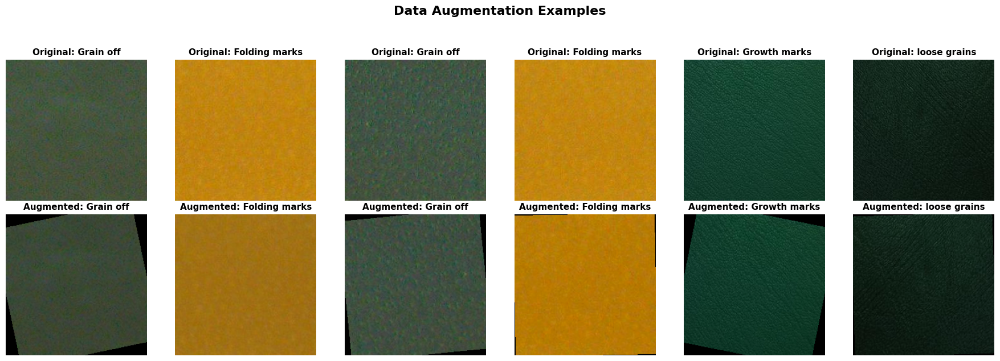

In [ ]:
num_images = 6
random_indices = random.sample(range(len(train_final)), num_images)

class_names = dataset.classes

fig, axes = plt.subplots(2, num_images, figsize=(18, 6))
fig.suptitle("Data Augmentation Examples", fontsize=16, fontweight='bold', y=1.05)

for i, idx in enumerate(random_indices):
    raw_img, label_idx = train_final.subset[idx]
    label_name = class_names[label_idx]

    aug_tensor, _ = train_final[idx]
    aug_img = (aug_tensor / 2) + 0.5
    aug_np = aug_img.numpy()
    aug_np = np.transpose(aug_np, (1, 2, 0))
    aug_np = np.clip(aug_np, 0, 1)

    axes[0, i].imshow(raw_img)
    axes[0, i].set_title(f"Original: {label_name}", fontsize=11, fontweight='bold')
    axes[0, i].axis('off')

    axes[1, i].imshow(aug_np)
    axes[1, i].set_title(f"Augmented: {label_name}", fontsize=11, fontweight='bold')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

## **Model Implementation**

We implement a custom version of ResNet-18, specifically designed for our leather defect classification task. The model follows the residual learning framework introduced by He et al. in *Deep Residual Learning for Image Recognition*, but it is implemented from scratch in PyTorch to maintain full architectural control and adapt it to the specific high-frequency characteristics of our dataset.

As originally proposed, ResNet reformulates the learning objective so that stacked layers approximate a residual function $F(x) := H(x) - x$, allowing the network to learn mappings of the form $H(x) = F(x) + x$ through identity shortcut connections.

These shortcuts fundamentally address the vanishing gradient problem observed in very deep plain networks. During backpropagation, the gradient can flow directly and unaltered through the identity connection ($+x$), reaching shallower layers without being diminished by deep matrix multiplications. Furthermore, if the network determines that the input $x$ is already optimal for a certain level of abstraction, the optimizer can simply push the weights of $F(x)$ toward zero, naturally collapsing $H(x)$ into an identity mapping.

Building upon this mathematical principle, our implementation preserves the core residual structure while introducing critical task-specific adaptations aimed at improving performance on fine-grained leather surface defects.

### **Residual Block (`BasicBlock`)**

Each residual block consists of:

* Two $3 \times 3$ convolutional layers;
* Batch Normalization after each convolution;
* ReLU activation;
* An identity shortcut connection.

If the spatial resolution or the number of channels changes (i.e., when `stride != 1` or `in_channels != out_channels`), the shortcut path is adjusted using a $1 \times 1$ linear projection (convolution) followed by Batch Normalization. This ensures the identity tensor $x$ is properly resized and dimensionally aligned for the element-wise addition $F(x) + x$.

In [ ]:
class BasicBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(BasicBlock, self).__init__()

        # We use a 3x3 convolution. If stride > 1, this layer handles spatial downsampling.
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

        # The second convolution completes the residual function F(x).
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        # The shortcut connection represents the identity mapping 'x'.
        self.shortcut = nn.Sequential()

        # If spatial dimensions shrink or channel depth increases,
        # we apply a 1x1 linear projection to align the tensor dimensions
        # before the elementwise addition.
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        # We store the original input to bypass the convolutional layers.
        identity = self.shortcut(x)

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)

        # H(x) = F(x) + x
        out += identity
        out = self.relu(out)
        return out

### **Network Architecture (`CustomResNet18`)**

The overall architecture follows the canonical ResNet-18 configuration, but with a fundamental modification at the stem:

**Initial Convolutional Layer and Max-Pooling Omission**

The network's entry point consists of a $7 \times 7$ convolutional operation configured with 64 output channels, a stride of 2, and a padding of 3. This is immediately followed by Batch Normalization and a Rectified Linear Unit (ReLU) activation. Crucially, unlike the original ResNet-18, the initial Max-Pooling layer has been intentionally omitted.

This is a deliberate, domain-specific design choice. Given input tensors with spatial dimensions of $224 \times 224$ pixels, the first strided convolution reduces the feature map resolution to $112 \times 112$. In a standard ResNet, a subsequent Max-Pooling operator would aggressively downsample this representation to $56 \times 56$. Because leather defects, such as *pinholes* or subtle *folding marks*, manifest as high-frequency spatial gradients occupying a minuscule pixel area, Max-Pooling would inadvertently act as a severe low-pass filter, erasing these critical micro-structures into the background noise. By bypassing this pooling step, our `CustomResNet18` propagates a highly detailed $112 \times 112$ receptive grid into the first residual stage, ensuring the network preserves and specializes in fine-grained textural anomalies.

Following the theoretical foundations of the ResNet architecture, our `CustomResNet18` implementation is structured into four distinct residual stages. The design carefully manages spatial downsampling, channel expansion, and gradient flow to ensure robust feature extraction.

**Residual Layers**

The core feature extraction is driven by four sequential modules (`self.layer1` through `self.layer4`).

* The initial module (`layer1`) processes the feature maps while maintaining the input and output spatial dimensions.
* To manage computational complexity and increase the receptive field, the subsequent three modules introduce spatial reduction. Dimensionality reduction is achieved using a downsample per module approach rather than relying on pooling layers. By applying `stride=2` to the first block of `layer2`, `layer3`, and `layer4` via the `_make_layer` function, the network effectively halves the spatial resolution while simultaneously doubling the channel depth (progressing from 64 to 128, 256, and finally 512 channels).

To guarantee unimpeded gradient flow during backpropagation and mitigate the vanishing gradient problem, the underlying `BasicBlock` evaluates the residual mapping ($f(x) = g(x) + x$) using two distinct types of skip connections:

* Identity Shortcut: When the input and output dimensions are mathematically identical, a simple, parameter-free skip connection ($+x$) is applied. This is utilized throughout `layer1` and in all secondary blocks of the deeper stages.
* Projection Shortcut ($1 \times 1$ Convolution): When tensor dimensions change across stages, specifically when halving the spatial resolution and doubling the channels, the shapes must be aligned before the element-wise addition. By passing the `stride` variable dynamically within the `_make_layer` loop, our implementation triggers a $1 \times 1$ convolutional projection exclusively when necessary, ensuring dimensional consistency without unnecessarily inflating the parameter count.

**Global Feature Aggregation**

After the final residual stage, the `nn.AdaptiveAvgPool2d((1, 1))` reduces the spatial dimensions to $1 \times 1$, independently of the incoming feature map size.
This provides extreme architectural flexibility and acts as a strong regularizer. It collapses the 512 spatial feature maps into a single 512-dimensional vector, effectively summarizing the global presence of learned features regardless of their exact spatial location on the leather sample.

**Classification Head**

The final classifier consists of a single fully connected layer: `Linear(512 → 6)`, where 6 corresponds to the number of mutually exclusive leather defect classes. Consistent with the canonical ResNet-18, we avoid complex bottleneck blocks, relying entirely on the expressive power of the BasicBlocks.

In summary, our main architectural choices are:

1. Residual learning to stabilize deep training and ensure healthy gradient flow.
2. Intentional removal of the initial max-pooling layer to prevent the loss of high-frequency spatial details crucial for fine-grained texture analysis.
3. Learned spatial downsampling coupled with progressive channel expansion (64 → 128 → 256 → 512) to extract abstract semantic features without relying on destructive pooling operations.
4. Adaptive average pooling to achieve spatial invariance and mitigate overfitting prior to classification.
5. A streamlined fully connected head for direct and robust multiclass prediction.

This implementation provides a strong and interpretable baseline model tailored for industrial leather defect classification, maintaining architectural transparency and full control over the training dynamics.

In [ ]:
class CustomResNet18(nn.Module):
    def __init__(self, num_classes=6):
        super(CustomResNet18, self).__init__()
        self.in_channels = 64

        # We use a 7x7 kernel to capture broad initial features.
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)

        # as we progress, spatial resolution is halved (stride=2),
        # while feature channels are doubled (64 -> 128 -> 256 -> 512).
        self.layer1 = self._make_layer(64, num_blocks=2, stride=1)
        self.layer2 = self._make_layer(128, num_blocks=2, stride=2)
        self.layer3 = self._make_layer(256, num_blocks=2, stride=2)
        self.layer4 = self._make_layer(512, num_blocks=2, stride=2)

        # Adaptive pooling provides spatial invariance. It ensures the classifier
        # always receives a 512 dimensional vector, regardless of the intermediate tensor shapes.
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

        # Final fully connected layer mapping directly to our 6 mutually exclusive classes.
        self.fc = nn.Linear(512, num_classes)

    def _make_layer(self, out_channels, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for s in strides:
            layers.append(BasicBlock(self.in_channels, out_channels, stride=s))
            self.in_channels = out_channels
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        # Flowing through the residual layers
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        # Global aggregation and final classification
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)

        return x

### **Weight Initialization and Non-Linear Activation**

The proper initialization of convolutional filters and the choice of activation functions are a critical step in deep neural networks to prevent the vanishing and exploding gradient problems. In our architecture, we establish a precise mathematical pairing between the Kaiming (He) initialization and the Rectified Linear Unit (ReLU) activation.

To introduce the necessary nonlinearities, we employ the ReLU activation, mathematically defined as:

$$f(x) = \max(0, x)$$

The use of ReLU, however, introduces a statistical challenge. Because ReLU is heavily asymmetric and completely zeros out all negative input values, it effectively eliminates $50$% of the signal's variance (assuming the inputs to the layer are distributed symmetrically around zero). If standard initialization techniques were used, the variance of the activations would be halved at each layer, exponentially decaying to zero and stalling the learning process.

To compensate for this $50$% variance loss, the network utilizes Kaiming (He) initialization, which mathematically proves that the variance of the initial weights must be doubled to stabilize the signal.
Let $W$ represent the weight tensor of a convolutional layer, and let $n_{\text{in}}$ (often referred to as *fan-in*) denote the number of input connections to a given neuron (calculated as $\text{input_channels} \times \text{kernel_height} \times \text{kernel_width}$). To maintain a stable variance across the deep residual blocks, the variance of the weights is defined as:


$$\text{Var}(W) = \frac{2}{n_{\text{in}}}$$

Consequently, PyTorch initializes the `nn.Conv2d` layers by drawing weights from a distribution parameterized by this variance. While a zero-mean Normal distribution $\mathcal{N}\left(0, \frac{2}{n_{\text{in}}}\right)$ can be used, the default implementation samples the weights $W$ from a bounded Uniform distribution $\mathcal{U}(-a, a)$, where the bound $a$ is explicitly derived to yield the exact same variance:


$$a = \sqrt{\frac{6}{n_{\text{in}}}} \implies W \sim \mathcal{U}(-a, a)$$

This rigorous mathematical formulation ensures that when the feature maps pass through the convolutional filters and the subsequent ReLU activations within our `BasicBlock` modules, the scale of the forward activations and backward gradients remains strictly stable, enabling robust and efficient convergence.

## **Model Training**

To train our `CustomResNet18`, we designed a comprehensive training pipeline focused on robust convergence, hyperparameter optimization, and overfitting mitigation. The optimization process is driven by the Adam optimizer and is heavily regulated by a dynamic learning rate scheduler and an early stopping mechanism.

### **Optimization Strategy**

To optimize the training process of our Custom ResNet-18, we performed a systematic Grid Search over different initial learning rates to identify the configuration yielding the peak validation performance. Specifically, we evaluated four candidate values:


$$\eta_{init} \in \{10^{-3}, 5 \times 10^{-4}, 10^{-4}, 10^{-5}\}$$

For each configuration, the model was trained for a maximum of 80 epochs. The best model was selected based on the lowest validation loss achieved across all grid search runs ($\theta^{*} = \text{argmin}_{\theta \in \text{all runs}} \mathcal{L}_{val}(\theta)$).

**Adam Optimizer and Learning Rate Scheduler**

The core of our optimization strategy is the Adaptive Moment Estimation optimizer (`optim.Adam`). Adam is particularly appropriate for deep networks because it calculates adaptive learning rates for each individual parameter by maintaining two moving averages: the first moment $m_t$ (the mean of gradients) and the second moment $v_t$ (the uncentered variance).

The parameter update at step $t$ is defined as:


$$\theta_{t+1} = \theta_{t} - \frac{\eta}{\sqrt{\hat{v}_t} + \epsilon} \hat{m}_t$$

While Adam manages per-parameter adaptation, we integrated a `ReduceLROnPlateau` scheduler to manage the global learning rate boundary. The scheduler monitors the validation loss with a `patience = 3`: if no improvement is observed for three consecutive epochs, the global learning rate $\eta$ is decayed by a `factor = 0.1`:


$$\eta_{new} = 0.1 \cdot \eta_{current}$$

This synergy is vital: while Adam handles the internal balancing of gradients, the scheduler informs Adam when it is time to reduce the global speed. By lowering $\eta$, we allow the optimizer to perform finer, more precise updates in the proximity of the local minimum, preventing the model from overshooting or oscillating around the optimal solution.

**Early Stopping**

Directly linked to our scheduling strategy is the Early Stopping mechanism. To prevent overfitting and avoid unnecessary computation, we set an Early Stopping threshold with a `patience = 10`.

If the validation loss fails to reach a new minimum for ten consecutive epochs, even after the scheduler has attempted to refine the search by reducing the learning rate training is forcefully interrupted. This ensures that the weights saved correspond to the peak generalization capability of the network rather than an overfitted state where the model has simply memorized the training distribution.

**Cross-Entropy Loss**

To guide the optimization process, we adopt Cross-Entropy Loss. Since our task is a six class classification problem where categories are mutually exclusive, the network outputs raw logits $z_i$, which are transformed into a probability distribution $p_i$ via the Softmax function:


$$p_i = \frac{e^{z_i}}{\sum_{j=1}^{6} e^{z_j}}$$

The loss for a single sample is defined as:


$$\mathcal{L} = -\sum_{i=1}^{6} y_i \log(p_i)$$

This formulation is particularly effective for our leather defect dataset for two main reasons:

* It strongly penalizes confident misclassifications. If the model assigns a high probability to the wrong class, the loss increases exponentially, forcing the model to adjust its decision boundaries.

* Minimizing this loss is fundamentally equivalent to minimizing the divergence between the predicted probability distribution and the true distribution of the labels. This ensures that the model learns to produce sharper and more reliable predictions, which is crucial for distinguishing subtle texture variations.

**Monitoring**

For each configuration, we recorded:

* Training Loss;
* Training Accuracy;
* Validation Loss;
* Validation Accuracy;
* Learning Rate Evolution;
* Epoch Duration.

This comprehensive monitoring allowed us to analyze both optimization dynamics and generalization behavior across different learning rates.

At the end of the process, the combination with the lowest validation loss is selected as the optimal configuration. The corresponding model parameters are stored, along with the validation losses for all tested configurations, enabling further analysis on learning rate hyperparameter behaviour and on model evaluation.

In [ ]:
REPO_PATH = '/content/drive/MyDrive/00gerem00/DL-AI-Project/'
SAVE_DIR = os.path.join(REPO_PATH, 'models_best')
os.makedirs(SAVE_DIR, exist_ok=True)

lr_values = [1e-3, 5e-4, 1e-4, 1e-5]

num_epochs = 80
patience_es = 10
patience_sched = 3

global_best_loss = float("inf")
global_best_lr = None
global_best_model_state = None

results_summary = {}
full_histories = {}

print(f"Save directory: {SAVE_DIR}")
print("STARTING GRID SEARCH WITH FULL MONITORING (LOSS, ACCURACY, LR, TIME)")

for initial_lr in lr_values:
    print("\n" + "="*70)
    print(f"TESTING INITIAL LEARNING RATE: {initial_lr}")
    print("="*70)

    model = CustomResNet18(num_classes=6).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=initial_lr)

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience_sched)

    counter_es = 0
    best_val_loss_current = float("inf")

    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [], 'val_acc': [],
        'lr_evolution': [], 'epoch_duration': []
    }

    for epoch in range(num_epochs):
        start_time = time.time()

        # Track current Learning Rate before the step
        current_lr = optimizer.param_groups[0]['lr']
        history['lr_evolution'].append(current_lr)

        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_loss = running_loss / total_train
        train_acc = correct_train / total_train

        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_loss = val_loss / total_val
        val_acc = correct_val / total_val

        scheduler.step(val_loss)

        duration = time.time() - start_time
        history['epoch_duration'].append(duration)
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        print(f"Epoch [{epoch+1:2d}/{num_epochs}] - Time: {duration:.0f}s - LR: {current_lr:.6f}")
        print(f"  Train -> Loss: {train_loss:.4f} | Accuracy: {train_acc*100:.2f}%")
        print(f"  Val   -> Loss: {val_loss:.4f} | Accuracy: {val_acc*100:.2f}%")
        print("-" * 30)

        if val_loss < best_val_loss_current:
            best_val_loss_current = val_loss
            counter_es = 0
            if val_loss < global_best_loss:
                global_best_loss = val_loss
                global_best_lr = initial_lr
                global_best_model_state = copy.deepcopy(model.state_dict())
                print(f"   *** NEW GLOBAL RECORD! Best Val Loss: {global_best_loss:.4f} ***")
        else:
            counter_es += 1
            if counter_es >= patience_es:
                print(f"Early Stopping triggered at epoch {epoch+1}.")
                break

    results_summary[f"Initial_LR_{initial_lr}"] = {
        'best_val_loss': best_val_loss_current,
        'final_accuracy': val_acc
    }
    full_histories[f"Initial_LR_{initial_lr}"] = history


best_model_path = os.path.join(SAVE_DIR, "RESNET18_GLOBAL_BEST.pth")
torch.save(global_best_model_state, best_model_path)

summary_json_path = os.path.join(SAVE_DIR, "grid_search_summary.json")
with open(summary_json_path, "w") as f:
    json.dump(results_summary, f, indent=4)

full_logs_json_path = os.path.join(SAVE_DIR, "full_training_logs.json")
with open(full_logs_json_path, "w") as f:
    json.dump(full_histories, f, indent=4)

print("\nGRID SEARCH FINISHED")
print(f"Winning Initial LR: {global_best_lr}")
print(f"Global Best Loss: {global_best_loss:.4f}")
print(f"All files saved in: {SAVE_DIR}")

Save directory: /content/drive/MyDrive/00gerem00/DL-AI-Project/models_best
STARTING GRID SEARCH WITH FULL MONITORING (LOSS, ACCURACY, LR, TIME)

TESTING INITIAL LEARNING RATE: 0.001
Epoch [ 1/80] - Time: 40s - LR: 0.001000
  Train -> Loss: 1.3584 | Accuracy: 44.80%
  Val   -> Loss: 1.0623 | Accuracy: 59.44%
------------------------------
   *** NEW GLOBAL RECORD! Best Val Loss: 1.0623 ***
Epoch [ 2/80] - Time: 39s - LR: 0.001000
  Train -> Loss: 1.1025 | Accuracy: 52.58%
  Val   -> Loss: 0.8413 | Accuracy: 65.00%
------------------------------
   *** NEW GLOBAL RECORD! Best Val Loss: 0.8413 ***
Epoch [ 3/80] - Time: 39s - LR: 0.001000
  Train -> Loss: 1.1090 | Accuracy: 52.50%
  Val   -> Loss: 0.9301 | Accuracy: 59.44%
------------------------------
Epoch [ 4/80] - Time: 39s - LR: 0.001000
  Train -> Loss: 1.0277 | Accuracy: 54.01%
  Val   -> Loss: 0.8358 | Accuracy: 63.52%
------------------------------
   *** NEW GLOBAL RECORD! Best Val Loss: 0.8358 ***
Epoch [ 5/80] - Time: 39s - LR

> We load the best model's training logs and previously saved optimal weights onto the current device.

In [ ]:
base_path = '/content/drive/MyDrive/00gerem00/DL-AI-Project/models_best/'

with open(os.path.join(base_path, 'full_training_logs.json'), 'r') as f:
    full_histories = json.load(f)

with open(os.path.join(base_path, 'grid_search_summary.json'), 'r') as f:
    summary = json.load(f)

best_lr_key = "Initial_LR_0.0001"
history = full_histories[best_lr_key]

model = CustomResNet18(num_classes=6)
model.load_state_dict(torch.load(os.path.join(base_path, 'RESNET18_GLOBAL_BEST.pth'), map_location=device))
model = model.to(device)
model.eval()

CustomResNet18(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), s

## **Best Results**

Following the Grid Search procedure over different initial learning rates, the best performing configuration was identified as the model trained with an **Initial Learning Rate** of $10^{-4}$. The model selection criterion was strictly based on minimizing the validation loss to ensure well calibrated confidence in predictions.

Under this configuration, the saved model achieved the lowest Validation Loss of $0.2420$, with a corresponding Validation Accuracy of $92.04\%$. It is worth noting that while the network reached a peak validation accuracy of $92.96\%$ at epoch 46, the model weights were selected based on the epoch with the minimum loss. This guarantees that the final model possesses the most robust and well calibrated decision boundaries, rather than simply maximizing raw accuracy at the expense of overconfident misclassifications.

In comparison, higher learning rates such as $10^{-3}$ and $5 \times 10^{-4}$ converged faster in the early stages but stabilized at higher minimum validation losses ($0.3061$ and $0.3003$ respectively). This indicates less precise optimization, as the larger step sizes likely caused the optimizer to oscillate around the minimum. Conversely, the smallest learning rate ($10^{-5}$) produced very stable training but resulted in a slightly higher validation loss ($0.2526$), suggesting an inability to effectively escape suboptimal regions to fine-tune the feature representations.

Overall, the learning rate of $10^{-4}$ provided the optimal balance between convergence speed and generalization performance. Consequently, its corresponding weights, saved strictly at the epoch of minimum validation loss, were selected as the definitive global model for all subsequent evaluations.

## **Training Dynamics**

Before evaluating our model on unseen data, we retrospectively analyze the training dynamics of the selected configuration (Initial `lr_value` = $10^{-4}$) by visualizing the evolution of training and validation loss, training and validation accuracy, and the learning rate schedule across epochs.

These plots allow us to verify the convergence behavior and confirm the absence of overfitting. Furthermore, they highlight the effectiveness of the `ReduceLROnPlateau` scheduler, which dynamically refined the optimization process by reducing the step size when the validation loss plateaued, enabling the model to settle into an optimal local minimum.

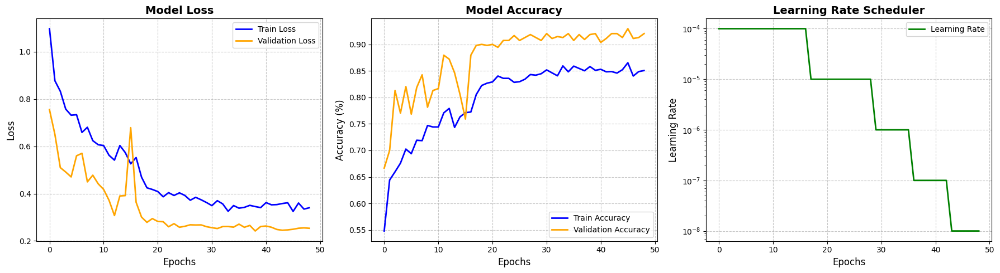

In [ ]:
best_lr_key = "Initial_LR_0.0001"
history = full_histories[best_lr_key]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

ax1.plot(history['train_loss'], label='Train Loss', color='blue', linewidth=2)
ax1.plot(history['val_loss'], label='Validation Loss', color='orange', linewidth=2)
ax1.set_title('Model Loss', fontsize=14, fontweight='bold')
ax1.set_xlabel('Epochs', fontsize=12)
ax1.set_ylabel('Loss', fontsize=12)
ax1.legend()
ax1.grid(True, linestyle='--', alpha=0.7)

ax1_epochs = range(len(history['train_acc']))
ax2.plot(history['train_acc'], label='Train Accuracy', color='blue', linewidth=2)
ax2.plot(history['val_acc'], label='Validation Accuracy', color='orange', linewidth=2)
ax2.set_title('Model Accuracy', fontsize=14, fontweight='bold')
ax2.set_xlabel('Epochs', fontsize=12)
ax2.set_ylabel('Accuracy (%)', fontsize=12)
ax2.legend()
ax2.grid(True, linestyle='--', alpha=0.7)

ax3.plot(history['lr_evolution'], label='Learning Rate', color='green', linewidth=2)
ax3.set_title('Learning Rate Scheduler', fontsize=14, fontweight='bold')
ax3.set_xlabel('Epochs', fontsize=12)
ax3.set_ylabel('Learning Rate', fontsize=12)
ax3.set_yscale('log')
ax3.legend()
ax3.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

The three subplots above illustrate the optimization trajectory of the best performing `CustomResNet18` configuration across 49 epochs of training. The graphs collectively demonstrate a well-controlled learning process, characterized by stable convergence and effective hyperparameter scheduling.

**1. Model Loss Evaluation**

The left plot (Model Loss) highlights the network's learning efficiency. During the initial 15 epochs, both training and validation losses drop steeply, indicating that the model is rapidly learning the fundamental structural features of the different leather defects. Crucially, the validation loss closely tracks the training loss without diverging upward, which suggests that the implicit regularization provided by Batch Normalization successfully prevents early overfitting.

The absolute minimum validation loss ($0.2420$) is achieved at epoch 39. Beyond this point, the validation loss begins to subtly oscillate and increase slightly, while the training loss continues its slow descent. This decoupling marks the onset of mild overfitting, which is correctly identified and halted by the Early Stopping mechanism at epoch 49.

**2. Model Accuracy Progression**

The center plot (Model Accuracy) mirrors the loss dynamics but focuses on classification correctness. The validation accuracy rises sharply in the first 10 epochs, quickly surpassing the 80% threshold. The curves demonstrate high stability, lacking the severe spikes or drops that typically characterize an excessively high learning rate. While the model reaches a peak validation accuracy of $92.96\%$ at epoch 46, the weights were intentionally saved at epoch 39 (corresponding to the minimum loss) to prioritize well-calibrated class probabilities over slightly overconfident, localized accuracy gains.
Notably, the accuracy curves are characterized by low volatility, confirming that the batch size and learning rate were well-balanced for the complexity of the 6 class leather defect dataset.

**3. Impact of the Learning Rate Scheduler**

The right plot (Learning Rate Scheduler) visualizes the active interventions of the `ReduceLROnPlateau` algorithm. Starting at $\eta = 10^{-4}$, the scheduler detects optimization plateaus and triggers step-wise reductions (factor = 0.1) at key intervals (epochs 18, 30, 37, and 44).
The log-scale visualization shows that the training concluded with a learning rate in the magnitude of $10^{-8}$, indicating that the model reached a highly stable convergence point before the early stopping or epoch limit was reached.
By cross-referencing this plot with the Loss and Accuracy graphs, the synergy between Adam and the scheduler becomes evident:

* The first decay at epoch 18 allows the model to escape a temporary stagnation, prompting a renewed, gentle descent in the validation loss.
* Subsequent decays precisely control the optimizer's step size, enabling the network to micro-tune the feature weights and settle safely into the deepest region of the local minimum at epoch 39.

The synergy between the model architecture and the dynamic learning rate adjustment resulted in a highly performant classifier.

# **Test Evaluation**

Having confirmed the stability of the training process by analyzing the Training Dynamics, we now proceed with a comprehensive evaluation of the final model. To ensure a strictly unbiased assessment of the network's real-world generalization capabilities, all subsequent metrics and qualitative analyses are computed exclusively on the unseen test set, which was never exposed to the network during training or hyperparameter tuning.

The evaluation process is structured in three complementary steps:

* First, we performed inference strictly on the **test set** to obtain predicted labels and compared them with ground truth annotations. This enabled us to compute a **Confusion Matrix**, providing a detailed view of class-wise performance and highlighting potential misclassification patterns among visually similar defect categories on completely new data.
* Second, we generated a **Classification Report**, including precision, recall, and F1-score for each of the six classes. This step is crucial in our fine-grained leather defect classification task, as it allows us to evaluate whether the model performs consistently across all defect types in a simulated real-world scenario, rather than relying solely on global accuracy.
* Finally, we produced a qualitative **Inference Gallery**, displaying a random subset of test images along with their predicted and true labels. This visual inspection complements the quantitative metrics by offering an intuitive understanding of the model’s strengths and remaining weaknesses, particularly in visually ambiguous cases.

Together, these analyses provide a thorough evaluation of the implemented ResNet-18 model, combining class-level performance assessment and qualitative inspection of predictions on strictly unseen data.

## **Confusion Matrix**

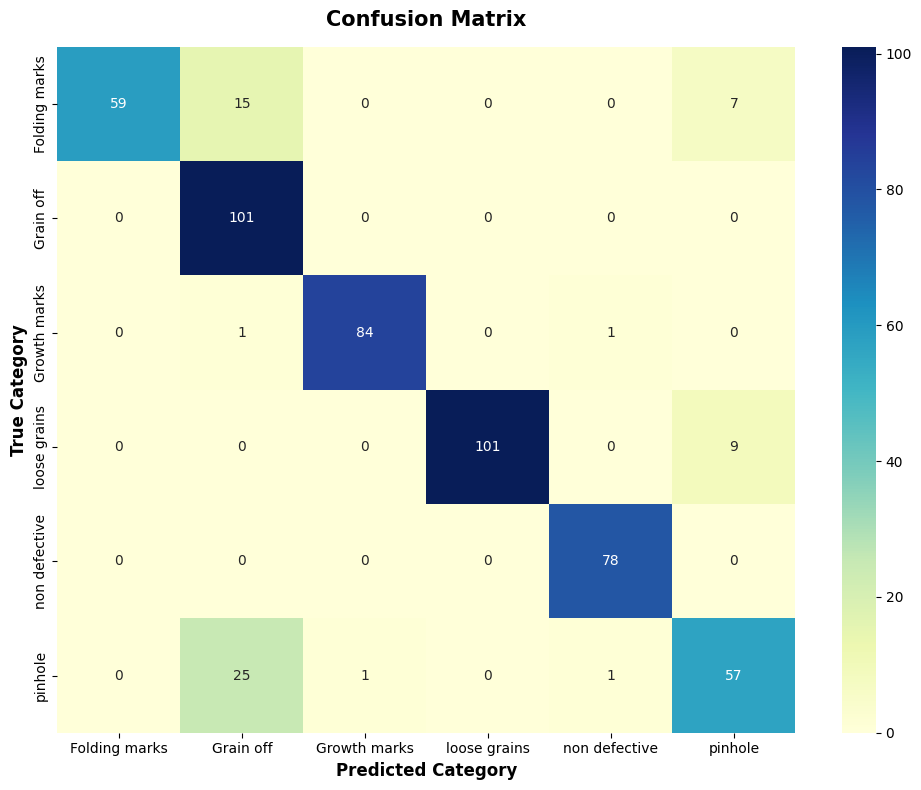

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

class_names = dataset.classes

def confusionmat(y_true, y_pred, classes):

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(10, 8))

    sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu',
                xticklabels=classes, yticklabels=classes)

    plt.title('Confusion Matrix', fontsize=15, fontweight='bold', pad=15)
    plt.ylabel('True Category', fontsize=12, fontweight='bold')
    plt.xlabel('Predicted Category', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()

confusionmat(all_labels, all_preds, class_names)

The visual distribution of predictions within the Confusion Matrix reveals a highly robust model with a strongly populated diagonal, confirming that the network has successfully learned discriminative feature representations for the majority of the dataset on the unseen test set.

* High-Performing Classes: The model exhibits exceptional reliability on the *Grain off* and *Non defective* classes, achieving perfect recognition ($101$/$101$ and $78$/$78$, respectively) with zero false negatives. Similarly, *Growth marks* ($84$/$86$) and *Loose grains* ($101$/$110$) are classified with high accuracy, demonstrating the architecture's capability to capture their distinct structural patterns.

* Areas of Textural Overlap: The misclassifications are not randomly distributed but are logically concentrated. The network primarily struggles with *Pinholes* ($25$ misclassified as *Grain off*) and *Folding marks* ($15$ misclassified as *Grain off* and 7 as *Pinhole*). Additionally, a minor overlap is observed where $9$ samples of *Loose grains* were predicted as *Pinhole*. This behavior is morphologically coherent: dense clusters of tiny puncture marks (*Pinholes*) or sharp, localized creases (*Folding marks*) can present high-frequency spatial gradients that closely mimic the roughened, eroded surface typical of a *Grain off* defect.

Overall, the matrix indicates a logically sound optimization where errors occur almost exclusively between classes sharing significant visual and textural overlap.

## **Classification Report**

In [ ]:
model.eval()

report_dict = classification_report(all_labels, all_preds,
                                    target_names=class_names, output_dict=True)
accuracy_val = report_dict.pop('accuracy')
df_report = pd.DataFrame(report_dict).transpose()
df_report['support'] = df_report['support'].astype(int)

Report = (
    df_report.style
    .set_caption("Classification Report")
    .format({
        'precision': '{:.2f}',
        'recall': '{:.2f}',
        'f1-score': '{:.2f}',
        'support': '{:d}'
    })
    .background_gradient(cmap='YlGnBu', subset=['precision', 'recall', 'f1-score'],
                         vmin=0.0, vmax=1.0)
    .set_table_styles([{
        'selector': 'caption',
        'props': [('color', 'black'), ('font-size', '16px'), ('font-weight', 'bold')]
    }])
)

print(f"Global Accuracy: {accuracy_val:.2%}\n")
Report

Global Accuracy: 88.89%



,precision,recall,f1-score,support
Folding marks,1.00,0.73,0.84,81
Grain off,0.71,1.00,0.83,101
Growth marks,0.99,0.98,0.98,86
loose grains,1.00,0.92,0.96,110
non defective,0.97,1.00,0.99,78
pinhole,0.78,0.68,0.73,84
macro avg,0.91,0.88,0.89,540
weighted avg,0.91,0.89,0.89,540


The model achieved a Global Accuracy of $88.89\%$ on the unseen test set. However, relying solely on global accuracy can be misleading in multi-class scenarios, especially when dealing with complex textural overlaps. Therefore, we computed the Precision, Recall, and F1-score for each category to evaluate the model's behavior on a per-class basis.

These metrics are derived from the True Positives (TP), False Positives (FP), and False Negatives (FN) extracted from the Confusion Matrix:

* Precision: Defined as $\frac{TP}{TP + FP}$. It measures the model's exactness. A high precision means that when the model predicts a specific defect, it is highly likely to be correct.
* Recall: Defined as $\frac{TP}{TP + FN}$. It measures the model's completeness. A high recall means the model successfully identified the majority of the true instances of a specific defect.
* F1-Score: Defined as the harmonic mean of Precision and Recall: $2 \cdot \frac{\text{Precision} \cdot \text{Recall}}{\text{Precision} + \text{Recall}}$. It provides a single, balanced metric that penalizes extreme disparities between Precision and Recall, making it the most robust indicator of a model's true performance.

The model demonstrates exceptional classification capabilities for *Growth marks*, *Loose grains*, and *Non defective* samples, all of which achieved an excellent F1-score ranging between $0.96$ and $0.99$.
Particularly noteworthy is the *Non defective* class, which achieved a perfect Recall of $1.00$ and a high Precision of $0.98$. This means the system successfully identified $100\%$ of the healthy leather samples (zero false negatives) while making almost no false alarms.

The metrics also perfectly encapsulate the visual confusion observed in the Confusion Matrix regarding the *Grain off*, *Folding marks*, and *Pinhole* classes:

* *Grain off*: This class achieved a perfect Recall ($1.00$), meaning the model successfully found every single actual *Grain off* defect. However, its Precision drops to $0.71$. This happens because the model over-predicts this class, absorbing the False Positives generated by misclassified *Folding marks* and *Pinholes*.
* *Folding marks*: Conversely, the *Folding marks* class exhibits a perfect Precision ($1.00$) but a noticeably lower Recall ($0.73$). This means that when the model explicitly predicts a *Folding mark*, it is absolutely correct ($100\%$ of the time). The lower recall is caused by the model missing several of these defects, erroneously classifying them under the visually similar, broader *Grain off* category.
* *Pinhole*: The *Pinhole* class proved to be the most challenging anomaly, recording a Precision of $0.78$ and a Recall of $0.68$. Rather than a generic distribution of errors, the misclassifications are highly specific. The lower recall is driven by $25$ actual *Pinhole* samples being misclassified as *Grain off*, as dense clusters of tiny puncture marks closely mimic the roughened, eroded surface of a grain off defect. Conversely, the drop in Precision is caused by the model incorrectly predicting *Pinhole* on $7$ *Folding marks* and $9$ *Loose grains* samples. In these cases, sharp localized creases or the natural wrinkles of relaxed skin likely cast point like shadows that the convolutional filters misinterpret as actual holes.

The overall Macro and Weighted F1-scores both stand at $0.89$, confirming that the model's performance is not artificially inflated by a single dominant class but remains highly balanced and effective across the dataset, even on strictly unseen data. The isolated drop in F1-scores for *Folding marks* ($0.84$), *Grain off* ($0.83$), and specifically *Pinhole* ($0.73$) is geometrically bounded and logically consistent with the severe textural overlap of these specific anomalies.

## **Inference Gallery**

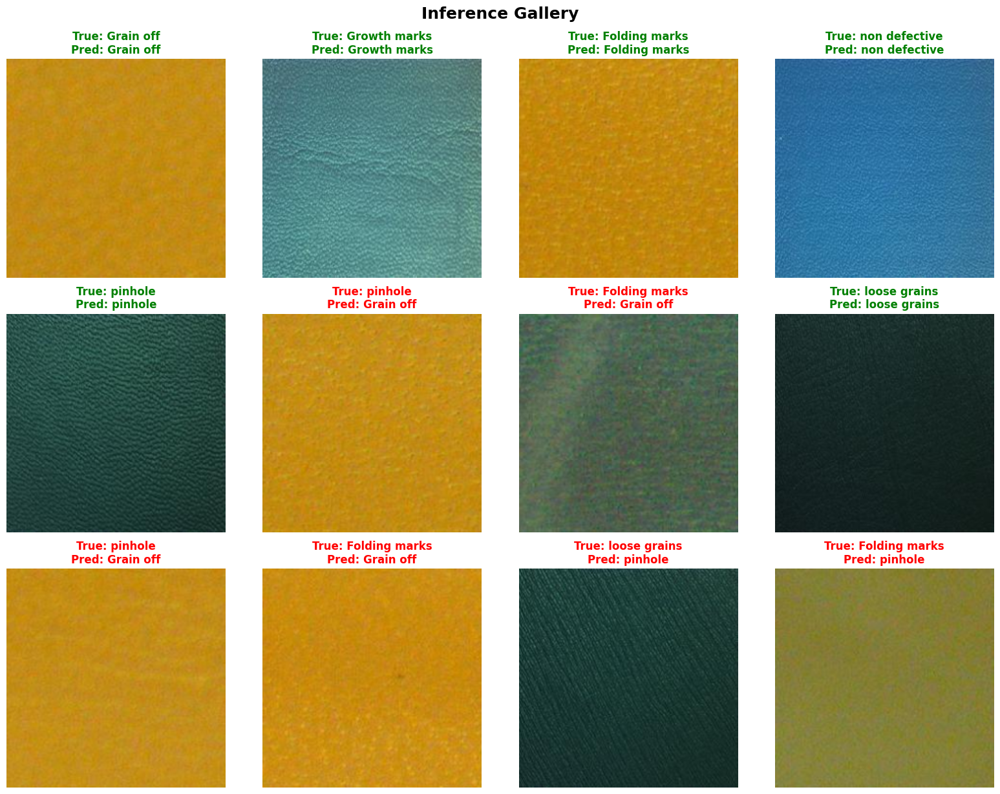

In [ ]:
model.eval()

# We want to find exactly 1 correct example for each of the 6 classes
correct_found = {c: 0 for c in class_names}

# We want to find specific errors discussed in our report to show textural overlap
errors_to_find = [
    ('pinhole', 'Grain off'),       # Case 1: Pinhole misclassified as Grain off
    ('pinhole', 'Grain off'),       # Case 2: Pinhole misclassified as Grain off
    ('Folding marks', 'Grain off'), # Case 3: Folding mark misclassified as Grain off
    ('Folding marks', 'Grain off'), # Case 4: Folding mark misclassified as Grain off
    ('loose grains', 'pinhole'),    # Case 5: Loose grain misclassified as Pinhole
    ('Folding marks', 'pinhole')    # Case 6: Folding mark misclassified as Pinhole
]

found_images = []

with torch.no_grad():
    # Scan the Test Set until we collect all 12 target images
    for image, label in test_loader.dataset:
        if len(found_images) == 12:
            break # Gallery complete, exit loop

        true_class = class_names[label]

        # Inference
        input_tensor = image.unsqueeze(0).to(device)
        output = model(input_tensor)
        _, pred_idx = torch.max(output, 1)
        pred_class = class_names[pred_idx.item()]

        # First Condition: It is a correct prediction and we don't have a sample for this class yet
        if true_class == pred_class and correct_found[true_class] < 1:
            found_images.append((image, true_class, pred_class, 'green'))
            correct_found[true_class] += 1

        # Second Condition: It is an incorrect prediction matching our specific error list
        elif true_class != pred_class:
            error_pair = (true_class, pred_class)
            if error_pair in errors_to_find:
                found_images.append((image, true_class, pred_class, 'red'))
                errors_to_find.remove(error_pair) # Remove from list to avoid duplicates

plt.figure(figsize=(16, 12))

for i, (image, true_c, pred_c, color) in enumerate(found_images):
    # Denormalization: Convert tensor back to original pixel range [0, 1]
    img = image.cpu().numpy().transpose((1, 2, 0))
    img = (img * 0.5) + 0.5
    img = np.clip(img, 0, 1)
    plt.subplot(3, 4, i+1)
    plt.imshow(img)
    title = f"True: {true_c}\nPred: {pred_c}"
    plt.title(title, color=color, fontsize=12, fontweight='bold')
    plt.axis('off')

plt.tight_layout()
plt.suptitle("Inference Gallery",
             fontsize=18, fontweight='bold', y=1.02)
plt.show()

To complement our quantitative evaluation and provide a tangible interpretation of the model's behavior, we conducted a qualitative visual analysis by plotting an Inference Gallery. The gallery was generated using a dual selection strategy from the test set. To ensure an unbiased evaluation, the network was set to evaluation mode (`model.eval()`) and gradient calculation was disabled (`torch.no_grad()`). For visualization, the raw image tensors were unnormalized ($x_{display} = x_{tensor} \times 0.5 + 0.5$) and clipped to the $[0, 1]$ range to reconstruct the original RGB pixel values.

The gallery (arranged in a $3 \times 4$ grid) was structured to provide a comprehensive overview of the model's performance:

1. Correct Classifications: One representative sample was selected for each of the six categories to visually confirm the model's ability to recognize the primary morphological features of every defect.
2. Misclassifications: Six specific error cases were selected to physically validate the textural overlap theory discussed in the performance metrics analysis.

The primary objective of this qualitative control is to move beyond numbers and observe the morphological triggers behind the errors. The red labeled images in the gallery provide a direct visual explanation for the performance drops observed in the *Grain off*, *Folding marks*, and *Pinhole* classes:

* *Pinhole* vs *Grain off*: In the samples where a *Pinhole* is misclassified as *Grain off*, we observe that the typical puncture marks are either too small or too shallow to be distinguished from the natural grain of the leather. This is especially evident on yellow toned samples, where the high frequency surface noise of a Grain off defect is visually indistinguishable from a dense field of micro pinholes. This explains why *Grain off* acts as a morphological sink, achieving a perfect recall of 1.00 by absorbing samples with ambiguous micro-textures.
* *Folding marks* vs *Grain off* and *Pinhole*: The misclassified *Folding marks* predicted as *Grain off* show a lack of a clear, directional crease or fold line. Without a strong linear geometric feature to extract, the convolutional filters default to the more general *Grain off* category. Furthermore, when a *Folding mark* is predicted as a *Pinhole*, it is often due to localized dark spots or shadows within a crease that the model misinterprets as individual puncture points.

* *Loose grains* vs *Pinhole*: The error involving *Loose grains* predicted as *Pinhole* is particularly revealing. On dark colored leather, the undulating, wavy texture of loose skin creates recessed areas of high contrast. The filters of the network likely perceive these sharp transitions in luminosity as the circular edges of pinholes, leading to a false positive.

Taken together, these visual cases confirm that the model's errors are not caused by architectural failures, but by the intrinsic morphological ambiguity of the leather defects. When a defect's visual signature lacks a distinct directional or structural pattern, the model's decision making process is logically bounded by the textural similarities between categories.

# **Model 2: Custom Convolutional Autoencoder Classifier**

The second model developed during our project is based on an autoencoder architecture. The primary goal of this phase does not consist in the direct classification of images, but rather in the unsupervised learning of meaningful and compact representations of the visual data. The neural network is indeed trained with the sole purpose of reconstructing at its output the exact same images provided as input. Through a process of spatial compression and subsequent decoding, the encoding component of the model is forced to map the information into a reduced-dimensionality latent space.

This operation, known as the architectural bottleneck, forces the system to discard redundant information or background noise, compelling it to retain exclusively the morphological, geometric, and textural characteristics essential for describing the surface of the examined material. This initial phase of generative training constitutes the indispensable theoretical and practical foundation for our subsequent application of transfer learning principles.

Once the encoder has learned to extract robust features that are intrinsically adapted to the domain of the analyzed industrial images, the decoding component is isolated and permanently removed, having exhausted its purpose of supporting the learning process. The pre-trained encoder is then converted into a feature extraction block and connected to a new fully connected neural network, which assumes the role of the classifier. This new combined system will have the final task of discriminating between compliant samples, belonging to the *non defective* class, and the various structural anomalies identified as *Folding marks*, *Grain off*, *Growth marks*, *loose grains*, and *pinhole*.

In this way, the classification process is not initialized randomly, but it exploits the deep spatial and visual understanding previously acquired by the autoencoder, with the aim of optimizing the convergence phase and maximizing the overall diagnostic capacity of our system.

## **Data Preprocessing & DataLoader**

In this section, we set up the data transformations and the DataLoader instances. Since the main goal of our Autoencoder is to achieve a highly accurate reconstruction of the original images, unlike the ResNet-18 classifier, we had to take a completely different approach for the preprocessing pipeline:

* We decided to skip data augmentation entirely. This means we purposely left out transformations like `RandomCrop()`, `RandomRotation()`, and `RandomHorizontalFlip()` from our training set. The reason is simple: the autoencoder needs to learn the actual spatial representation of the leather textures and their defects, without having to struggle with reconstructing pixels that have been artificially shifted or distorted.
* For resizing, we went with a more direct approach. Instead of doing a `Resize(230, 230)` followed by a `RandomCrop(224, 224)`, which we previously used to introduce translation invariance, we just applied a straightforward `Resize((224, 224))` using standard bilinear interpolation. This lets us smoothly compress the original $227 \times 227$ images without throwing away any important information around the borders, where some defects might actually be located.
* Finally, we changed how we handle pixel scaling by avoiding zero-centered normalization. In the ResNet-18 model, we mapped pixels to a [-1.0, 1.0] range to help with gradient flow during classification. Here, though, we only rely on `ToTensor()`, which keeps the pixel values in the [0.0, 1.0] range. This was a strict architectural requirement because the final layer of our decoder uses a Sigmoid activation function, which naturally outputs values between 0 and 1.

In [ ]:
class TransformSubset(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform

    def __getitem__(self, index):
        x, y = self.subset[index]
        if self.transform:
            x = self.transform(x)
        return x, y

    def __len__(self):
        return len(self.subset)

ae_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

train_final = TransformSubset(train_set, transform=ae_transform)
val_final = TransformSubset(val_set, transform=ae_transform)
test_final = TransformSubset(test_set, transform=ae_transform)

batch_size = 32

train_loader = DataLoader(train_final, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_final, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_final, batch_size=batch_size, shuffle=False)

## **Autoencoder Fully Convolutional**

During the preliminary phases of the project, we experimented with a traditional linear autoencoder architecture. However, empirical observations revealed that this approach was suboptimal given the specific visual characteristics of our dataset. The mandatory flattening operation required by dense fully connected layers intrinsically destroyed the two-dimensional spatial arrangement of the pixels, an element that proved to be critical for identifying continuous textural anomalies on leather surfaces.

Consequently, to achieve the objective of unsupervised feature extraction without losing spatial context, we implemented a custom architecture designed as a fully convolutional autoencoder.  Our definitive design choice is based entirely on convolutional operations. This structural decision is crucial for processing images of industrial materials, as it strictly preserves the spatial relationships, local geometries, and texture continuities of the leather surface throughout the entire compression and reconstruction pipeline.

## **Encoder**

The primary objective of the Encoder is to progressively compress the high-dimensional input images into a dense and informative latent representation, while rigorously preserving the spatial hierarchy of the extracted features. To achieve this, the network receives images with an initial resolution of $224 \times 224$ pixels and three RGB color channels, and processes them through a sequence of specifically tailored convolutional blocks.

We designed the architecture using a series of four primary downsampling layers. Each of these convolutional operations utilizes a kernel size of $3$, a padding of $1$, and a stride of $2$. The implementation of a stride greater than one represents a deliberate architectural choice: it allows the network to learn its own spatial downsampling operation, effectively halving the spatial dimensions of the feature maps at each step without relying on traditional pooling layers. Consequently, the spatial grid is progressively reduced from $224 \times 224$ to $112 \times 112$, $56 \times 56$, $28 \times 28$, and finally to $14 \times 14$ pixels.

Contextually, as the spatial dimensions decrease, the depth of the feature maps is systematically expanded. The channel depth begins at $32$ in the first layer and is doubled at each subsequent block, reaching $64$, $128$, and ultimately $256$ channels. This structural funneling enables the network to capture increasingly complex and abstract visual patterns from the leather surface. To ensure training stability, a batch normalization layer is applied immediately after each convolution to mitigate internal covariate shift, followed by a ReLu activation function to introduce the necessary non-linearities into the system.

The defining characteristic of our encoding implementation is found at the very end of this sequence, where the spatial bottleneck is established. After the fourth downsampling block, the intermediate tensor possesses a shape of $14 \times 14 \times 256$. At this critical juncture, instead of applying a flattening operation that would destroy the two-dimensional topology, we implemented a final convolutional layer with a stride of $1$. This specific layer maintains the $14 \times 14$ spatial grid intact but drastically compresses the channel depth from $256$ down to $64$.

The resulting $14 \times 14 \times 64$ latent tensor successfully forces the network to heavily compress the semantic information, retaining only the most salient features of the material, while keeping the structural geometry completely preserved for the subsequent tasks.

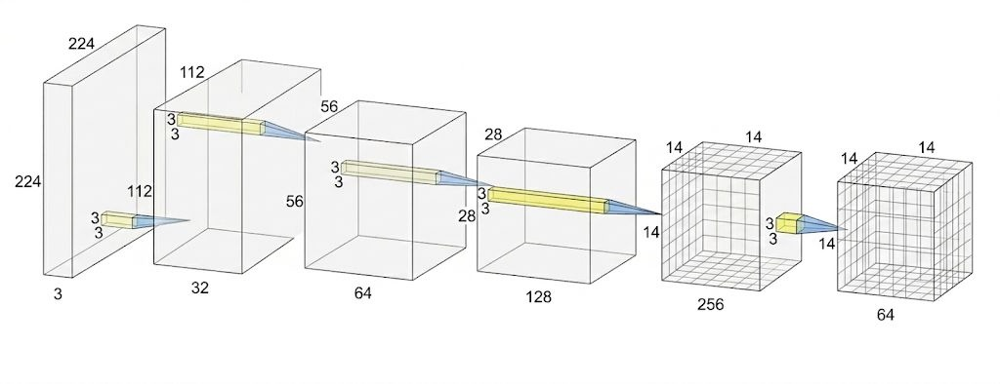

In [ ]:
class FullyConvEncoder(nn.Module):
    def __init__(self):
        super(FullyConvEncoder, self).__init__()
        self.encoder_cnn = nn.Sequential(
            # 224x224x3 -> 112x112x32
            nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            # 112x112x32 -> 56x56x64
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            # 56x56x64 -> 28x28x128
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            # 28x28x128 -> 14x14x256
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            # Spatial Bottleneck: 14x14x64
            nn.Conv2d(256, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.encoder_cnn(x)

## **Decoder**

The Decoder performs the specular inverse operation of the encoder. Its primary objective is to reconstruct the original visual input starting from the highly compressed $14 \times 14 \times 64$ spatial bottleneck, progressively restoring both the spatial resolution and the semantic details of the leather surface.

Starting from the latent tensor, the reconstruction pipeline begins with an initial standard convolution characterized by a stride of $1$. This operation maintains the $14 \times 14$ spatial grid but immediately expands the channel depth from $64$ back to $256$. This step is designed to project the compressed features into a higher-dimensional space, preparing the $14 \times 14 \times 256$ tensor for the subsequent upsampling phase.

To systematically restore the spatial resolution, the network utilizes a sequence of four transposed convolutional layers. Each of these operations is configured with a kernel size of $3$, a stride of $2$, a padding of $1$, and an output padding of $1$. This specific mathematical arrangement allows the network to effectively double the spatial dimensions of the feature maps at each step. Consequently, the spatial grid is progressively expanded from $14 \times 14$ to $28 \times 28$, $56 \times 56$, $112 \times 112$, and finally back to the original $224 \times 224$ pixel resolution.

Concurrently with the spatial expansion, the depth of the feature maps is systematically reduced. The channel depth is halved at each transposed convolution, decreasing from $256$ to $128$, $64$, $32$, and ultimately to $3$ channels, which correspond precisely to the original RGB color space.

Similar to the encoding phase, a batch normalization layer and a ReLu activation function are applied after each intermediate operation. This symmetrical design choice ensures stability in the gradient flow during backpropagation and maintains the non-linear learning capabilities of the network.

However, the final transposed convolution diverges from this pattern by utilizing a sigmoid activation function instead of a rectified linear unit. This terminal mathematical operation is fundamentally required to ensure that the reconstructed pixel values are correctly bounded within the continuous range between $0$ and $1$. Restricting the output domain in this manner allows for an exact, pixel-wise comparison with the original normalized input images during the calculation of the chosen reconstruction loss, enabling the network to accurately evaluate and minimize its generative error.

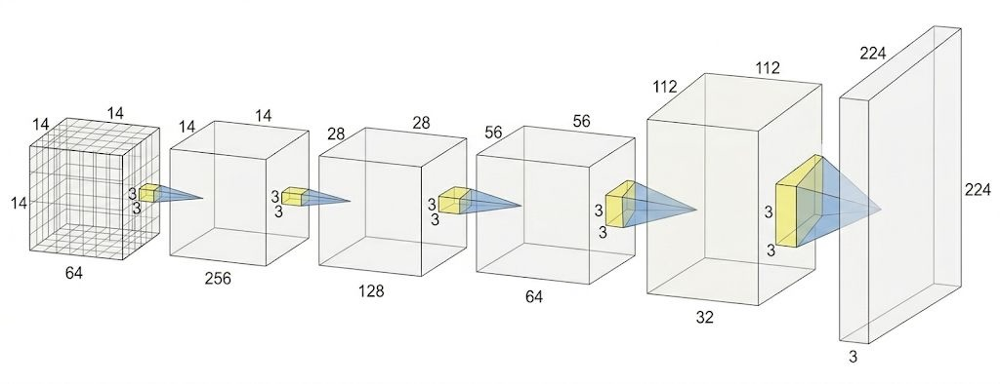

In [ ]:
class FullyConvDecoder(nn.Module):
    def __init__(self):
        super(FullyConvDecoder, self).__init__()
        self.decoder_cnn = nn.Sequential(
            # Dal bottleneck 14x14x64 torniamo su
            nn.Conv2d(64, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            # 14x14x256 -> 28x28x128
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            # 28x28x128 -> 56x56x64
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            # 56x56x64 -> 112x112x32
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            # 112x112x32 -> 224x224x3
            nn.ConvTranspose2d(32, 3, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.decoder_cnn(x)

To orchestrate the unsupervised learning process, the encoder and decoder are encapsulated within a unified module. Drawing upon the theoretical framework established by Goodfellow et al. (2016), our architecture functions by mapping an input $x$ to a latent representation $h$ via the encoder, denoted as $h = f(x)$, and subsequently reconstructing it via the decoder, where $r = g(h)$.

During the forward propagation phase, the encoder maps the high-dimensional input into the restrictive $14 \times 14 \times 64$ spatial bottleneck. As described in the reference literature, this structural limitation prevents the model from simply memorizing the data, actively forcing the neural network to prioritize and learn a robust, meaningful feature representation of the material surface. Immediately thereafter, the decoder projects this latent data back into the original $224 \times 224$ image space.

This formulation, concisely expressed as $\text{output} = \text{decoder}(\text{encoder}(x))$, allows our system to extract essential visual characteristics while entirely bypassing the need for explicit human-annotated labels during this generative phase.

In [ ]:
class FullyConvAutoencoder(nn.Module):
    def __init__(self):
        super(FullyConvAutoencoder, self).__init__()
        self.encoder = FullyConvEncoder()
        self.decoder = FullyConvDecoder()

    def forward(self, x):
        return self.decoder(self.encoder(x))

## **Loss Function**

### **Limitations of $L1$ and $L2$ Loss Functions**

In the preliminary phases of our autoencoder development, we conducted the training using standard loss functions for reconstruction tasks: the Mean Squared Error ($L2$ Loss) and the Mean Absolute Error ($L1$ Loss). However, the qualitative analysis of the generated images during the test phase highlighted a structural limitation of these metrics: being pixel-wise loss functions, they compute the error strictly independently for each pixel, completely ignoring the spatial correlation between adjacent pixels.

To mathematically minimize a point-wise error on a complex surface, our autoencoder tended to apply a drastic spatial averaging. The visual result translated into output images that faithfully reproduced the dominant color and the global lighting of the original sample, but appeared heavily blurred. This behavior caused the complete loss of high-frequency details, meaning the destruction of every feature related to the leather texture and, even worse, the visual elimination of the morphological defects themselves.

### **Structural Similarity Index Function ($\text{SSIM}$)**

To overcome this severe loss of information, we realized the need to adopt a metric capable of evaluating the visual quality of the reconstruction. Therefore, we integrated the Structural Similarity Index Measure ($\text{SSIM}$), a perceptual metric first introduced in the seminal paper *"Image quality assessment: from error visibility to structural similarity"* by Wang et al. (2004).

Unlike point-wise error metrics, the $\text{SSIM}$ operates by comparing local portions of the images. Given two spatial windows $x$ and $y$, extracted respectively from the original image and the reconstructed one through a sliding window of defined size (e.g., 5x5 pixels), the algorithm evaluates the similarity by combining three independent measurements:

* **Luminance comparison ($l$)**: measured through the average of the pixel values within the local window ($\mu_x$ and $\mu_y$).

$$l(x,y) = \frac{2\mu_x\mu_y + C_1}{\mu_x^2 + \mu_y^2 + C_1}$$


* **Contrast comparison ($c$)**: measured through the standard deviation ($\sigma_x$ and $\sigma_y$), which represents the spatial variance of the intensities.

$$c(x,y) = \frac{2\sigma_x\sigma_y + C_2}{\sigma_x^2 + \sigma_y^2 + C_2}$$


* **Structure comparison ($s$)**: measured through the covariance ($\sigma_{xy}$) between the two patches, which quantifies the degree of linear correlation and the alignment of the patterns.

$$s(x,y) = \frac{\sigma_{xy} + C_3}{\sigma_x\sigma_y + C_3}$$

The constants $C_1$, $C_2$, and $C_3$ play a fundamental role in the numerical stability of the algorithm, preventing divisions by zero in image areas with zero contrast or luminance (e.g., solid color zones). They are mathematically derived from the dynamic range of the image pixels, denoted as $L$, using the formula $C_i = (K_i \cdot L)^2$.

Since in our data pipeline the input tensors were normalized in the $[0, 1]$ range using the `ToTensor()` transformation, the dynamic range is exactly $L = 1$. By using the standard empirical constants from Wang et al. ($K_1 = 0.01$ and $K_2 = 0.03$), our constants are simply calculated as $C_1 = 0.01^2$ and $C_2 = 0.03^2$. Moreover, to simplify the final formula, it is imposed the condition $C_3 = C_2 / 2$.

The global $\text{SSIM}$ index for the single window is the product of the three components. By applying the simplification for $C_3$, the equation collapses into the following compact formula, which is exactly the one we implemented in our `compute_ssim` function:


$$\text{SSIM}(x,y) = \frac{(2\mu_x\mu_y + C_1)(2\sigma_{xy} + C_2)}{(\mu_x^2 + \mu_y^2 + C_1)(\sigma_x^2 + \sigma_y^2 + C_2)}$$


The final value is the arithmetic mean of all the values calculated by the individual sliding windows over the entire image.

### **`LeatherStructuralLoss`**

The exclusive use of $\text{SSIM}$ can lead to color shifting. To achieve the optimal balance between structural fidelity and color accuracy, we relied on a hybrid Custom Loss Function, which combines the perceptual power of $SSIM$ with the chromatic stability of the $L1$ Loss. The final formula implemented is the following:


$$\text{Total Loss} = \alpha \cdot (1 - \text{SSIM}) + (1 - \alpha) \cdot \text{L1}$$


It is governed by two fundamental hyperparameters: the `window_size` (which defines the receptive field for the texture continuity) and the balancing parameter `alpha` ($\alpha$), bounded between $[0, 1]$.

### **Scale Harmony of `alpha` hyperparameter**

A really important aspect of our `LeatherStructuralLoss` is the theoretical justification behind the `alpha` parameter. Setting this hyperparameter in a continuous range between 0 and 1 is intrinsically correct and doesn't require any empirical recalibration or scale multipliers to rebalance the gradients. This works exclusively because the $L1$ Loss and the ($1$ - $\text{SSIM}$) term natively share a comparable order of magnitude.

This scale harmony comes from the preprocessing pipeline and from the mathematical nature of the two functions:

1. **$L1$ Loss**: Thanks to the `ToTensor()` transformation, incoming pixel values are confined in the continuous interval between 0 and 1. As a consequence, the mean absolute error computed by the L1 Loss cannot theoretically exceed 1 and, during normal training dynamics, it quickly drops down to small decimal fractions.
2. **($1$ - $\text{SSIM}$)**: The raw $\text{SSIM}$ metric returns a correlation value between -1 and 1. By converting it into a loss through the following subtraction ($1$ - $\text{SSIM}$), the theoretical range becomes 0 to 2. However, since the neural network learns very quickly to generate at least coherent images (avoiding producing the exact "negative" of the original), the structural metric stabilizes on small positive decimal values close to zero.

Even though during training the absolute values taken by the two metrics differ from each other, since they measure intrinsically different visual attributes, their magnitudes naturally compete on the same numerical ground.

Since the generated gradients are naturally homogeneous, neither component mathematically crushes the other during backpropagation. This allowed `alpha` to behave right from the start as a pure and balanced interpolator. The absence of strong numerical scale instabilities let us delegate to the Grid Search the one and only task of finding the ideal perceptual trade-off for leather defect reconstruction, without having to worry about normalizing or artificially scaling the contributions of the two loss functions first.

In [ ]:
class LeatherStructuralLoss(nn.Module):
    def __init__(self, alpha, window_size):
        super(LeatherStructuralLoss, self).__init__()
        self.alpha = alpha
        self.window_size = window_size

        # Stability constants to prevent division by zero
        self.C1 = 0.01**2
        self.C2 = 0.03**2

    def compute_ssim(self, img1, img2):
        # Using Average Pooling to approximate the local window evaluation efficiently
        mu1 = F.avg_pool2d(img1, self.window_size, stride=1, padding=self.window_size//2)
        mu2 = F.avg_pool2d(img2, self.window_size, stride=1, padding=self.window_size//2)

        mu1_sq, mu2_sq, mu1_mu2 = mu1.pow(2), mu2.pow(2), mu1 * mu2

        # Computing local variances and covariance
        sigma1_sq = F.avg_pool2d(img1 * img1, self.window_size, stride=1, padding=self.window_size//2) - mu1_sq
        sigma2_sq = F.avg_pool2d(img2 * img2, self.window_size, stride=1, padding=self.window_size//2) - mu2_sq
        sigma12 = F.avg_pool2d(img1 * img2, self.window_size, stride=1, padding=self.window_size//2) - mu1_mu2

        # SSIM Formula components
        num = (2 * mu1_mu2 + self.C1) * (2 * sigma12 + self.C2)
        den = (mu1_sq + mu2_sq + self.C1) * (sigma1_sq + sigma2_sq + self.C2)

        return (num / (den + 1e-7)).mean()

    def forward(self, prediction, target):
        # 1. Compute pure SSIM value
        ssim_val = self.compute_ssim(prediction, target)

        # 2. Convert SSIM index into a Loss metric (1 - SSIM)
        ssim_loss = 1.0 - ssim_val

        # 3. Compute pure L1 Loss (Mean Absolute Error)
        l1_loss = F.l1_loss(prediction, target)

        # 4. Compute the weighted Total Loss
        total_loss = (self.alpha * ssim_loss) + ((1.0 - self.alpha) * l1_loss)

        return total_loss, ssim_loss, l1_loss

## **Model Training**

### **Hyperparameters Optimization: Grid Search**

To maximize the reconstructive capabilities of our Fully Convolutional Autoencoder and to fully exploit the potential of our newly defined `LeatherStructuralLoss`, we needed to find the optimal combination of hyperparameters, by implementic a systematic Grid Search.

Consistent with the initialization strategy detailed for our Custom ResNet-18 baseline, the Fully Convolutional Autoencoder relies on default Kaiming (He) initialization. Upon instantiation, all `nn.Conv2d` and `nn.ConvTranspose2d` layers are automatically initialized to prevent vanishing gradients. This ensures a mathematically stable zero-state prior to the reconstructive pre-training, providing an optimal starting point for both the Grid Search and the subsequent final training phas

### **Training Setup**

We evaluated the model across a discrete search space of critical hyperparameters:

* **Learning Rate (`lr_values` = [0.0005, 0.0001])**: We chose two relatively small values to ensure a stable convergence, preventing the optimizer from taking steps that are too large and overshooting the local minima.

* **Window Size (`window_sizes` = [3, 5])**: Testing both $3 \times 3$ and $5  \times 5$ sizes allows us to understand which receptive field is better suited to capture the specific micro textures and defects of the leather in our dataset.

* **Alpha (`alphas` = [0.84, 0.90, 0.95])**: It determines how much importance the network gives to structural preservation (SSIM) versus pixel-level color accuracy (L1). We centered our search around 0.84 (a value suggested by existing literature for image restoration) and tested higher values to see if prioritizing structure even more would give better defect reconstructions

The training loop incorporates several advanced deep learning techniques to ensure robust convergence:

**Optimizer and Learning Rate Scheduler**

For the optimization algorithm, we selected **Adam** (`optim.Adam`). Adam is highly efficient for image reconstruction tasks because it adapts the learning rate individually for each network weight based on the history of the gradients.
To further assist the optimizer, we introduced a `ReduceLROnPlateau` scheduler. If the validation loss stops improving for 3 consecutive epochs (`patience_sched = 3`), the scheduler automatically halves the learning rate (`factor=0.5`). This mechanism helps the model to "settle" gently into the minimum of the loss function when it gets close to it

**Loss Function Role**

During the training loop, the `LeatherStructuralLoss` acts as the main guide for the autoencoder. In the forward pass, the model generates a reconstructed image, and the criterion evaluates it against the original input.
As explained in the historical note within the code, we extract the combined total loss using the unpacking trick `loss, _, _ = criterion(outputs, inputs)`. By calling `loss.backward()`, the network calculates the gradients based on the convex combination of L1 and SSIM. This process forces the network to update its weights not just to match colors, but to accurately reproduce the leather's surface structures.

**Early Stopping and Checkpointing**

To prevent overfitting and optimize computational resources, an early stopping mechanism was integrated (`patience_es = 10`s). The system automatically tracks the "Global Best" state across all trials, ensuring that the final hyperparameters selected are those that truly minimize the reconstruction error on unseen data.

In [ ]:
REPO_PATH = '/content/drive/MyDrive/lorenzomeroni02/DL-AI-Project/'
SAVE_DIR = os.path.join(REPO_PATH, 'GridSearch_SSIM')
os.makedirs(SAVE_DIR, exist_ok=True)

lr_values = [0.0005, 0.0001]
window_sizes = [3, 5]
alphas = [0.84, 0.90, 0.95]

num_epochs = 80
patience_es = 10
patience_sched = 3

# Initialize global tracking variables to identify the absolute best model
global_best_loss = float("inf")
global_best_config = None
global_best_model_state = None

results_summary = {}
full_histories = {}


print("STARTING GRID SEARCH WITH FULL MONITORING (LOSS, LR, Alpha, Window_Size, Time)")

for initial_lr in lr_values:
    for win_size in window_sizes:
        for alpha in alphas:
            config_name = f"LR_{initial_lr}_Win_{win_size}_Alpha_{alpha}"

            print("\n" + "="*70)
            print(f"STARTING TRIAL: {config_name}")
            print("="*70)

            # Initialize the Autoencoder
            model = FullyConvAutoencoder().to(device)
            criterion = LeatherStructuralLoss(alpha=alpha, window_size=win_size)
            optimizer = optim.Adam(model.parameters(), lr=initial_lr)

            # Implement adaptive learning rate decay
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode='min', factor=0.5, patience=patience_sched
            )

            counter_es = 0
            best_val_loss_current = float("inf")

            history = {
                'train_loss': [],
                'val_loss': [],
                'lr_evolution': [],
                'epoch_duration': []
            }

            for epoch in range(num_epochs):
                start_time = time.time()

                # Record the active learning rate prior to any scheduler updates
                current_lr = optimizer.param_groups[0]['lr']
                history['lr_evolution'].append(current_lr)

                model.train()
                running_loss = 0.0
                total_train = 0

                # =========================================================================================
                # HISTORICAL NOTE ON LOSS FUNCTION DEFINITION:
                # When this Grid Search was originally executed, the LeatherStructuralLoss was defined
                # to return only a single scalar (the combined total loss).
                # We subsequently redefined the class to return a tuple of (total_loss, ssim_loss, l1_loss)
                # in order to monitor the individual loss components during the Final Training phase,
                # after identifying the optimal hyperparameters.
                # To use the updated class definition in this legacy Grid Search code without altering
                # its original experimental logic—and crucially, to avoid the heavy computational cost
                # of running again the entire Grid Search from scratch, we intentionally ignore the separated
                # metrics using '_': loss, _, _ = criterion(outputs, inputs)
                # =========================================================================================
                for inputs, _ in train_loader:
                    inputs = inputs.to(device)
                    optimizer.zero_grad()
                    outputs = model(inputs)
                    loss, _, _ = criterion(outputs, inputs)
                    loss.backward()
                    optimizer.step()

                    running_loss += loss.item() * inputs.size(0)
                    total_train += inputs.size(0)

                train_loss = running_loss / total_train

                # --- Validation Phase ---
                model.eval()
                val_loss = 0.0
                total_val = 0

                with torch.no_grad():
                    for inputs, _ in val_loader:
                        inputs = inputs.to(device)
                        outputs = model(inputs)
                        loss, _, _ = criterion(outputs, inputs)

                        val_loss += loss.item() * inputs.size(0)
                        total_val += inputs.size(0)

                val_loss = val_loss / total_val

                # Evaluate validation performance to adjust the learning rate if necessary
                scheduler.step(val_loss)

                duration = time.time() - start_time
                history['epoch_duration'].append(duration)
                history['train_loss'].append(train_loss)
                history['val_loss'].append(val_loss)

                print(f"Epoch [{epoch+1:2d}/{num_epochs}] - Time: {duration:.0f}s - LR: {current_lr:.6f}")
                print(f"  Train -> Loss: {train_loss:.4f}")
                print(f"  Val   -> Loss: {val_loss:.4f}")
                print("-" * 30)

                if val_loss < best_val_loss_current:
                    # reset the early stopping counter
                    best_val_loss_current = val_loss
                    counter_es = 0

                    # Save the current model weights specific to this configuration
                    trial_path = os.path.join(SAVE_DIR, f"{config_name}_best.pth")
                    torch.save(model.state_dict(), trial_path)

                    # Check if this configuration is better than all previous trials
                    if val_loss < global_best_loss:
                        global_best_loss = val_loss
                        global_best_config = config_name
                        global_best_model_state = copy.deepcopy(model.state_dict())
                        print(f"   *** NEW GLOBAL RECORD! Best Val Loss: {global_best_loss:.4f} ***")
                else:
                    counter_es += 1
                    if counter_es >= patience_es:
                        print(f"Early Stopping triggered at epoch {epoch+1}.")
                        break

            results_summary[config_name] = {
                'best_val_loss': best_val_loss_current
            }
            full_histories[config_name] = history

best_model_path = os.path.join(SAVE_DIR, "AUTOENCODER_GLOBAL_BEST.pth")
torch.save(global_best_model_state, best_model_path)

summary_json_path = os.path.join(SAVE_DIR, "grid_search_summary.json")
with open(summary_json_path, "w") as f:
    json.dump(results_summary, f, indent=4)

full_logs_json_path = os.path.join(SAVE_DIR, "full_training_logs.json")
with open(full_logs_json_path, "w") as f:
    json.dump(full_histories, f, indent=4)

print("\nGRID SEARCH FINISHED")
print(f"Winning Configuration: {global_best_config}")
print(f"Global Best Loss: {global_best_loss:.4f}")
print(f"All files saved in: {SAVE_DIR}")

> We omitted the training output do to space reasons. However the following cell of codes prints the Validation Loss of the best performing Model, together with the optimal Hyperparameters.

In [ ]:
REPO_PATH = '/content/drive/MyDrive/00gerem00/DL-AI-Project/'
SAVE_DIR = os.path.join(REPO_PATH, 'GridSearch_SSIM')
summary_json_path = os.path.join(SAVE_DIR, "grid_search_summary.json")

with open(summary_json_path, "r") as f:
    results_summary = json.load(f)

best_config_name = min(results_summary, key=lambda k: results_summary[k]['best_val_loss'])
best_val_loss = results_summary[best_config_name]['best_val_loss']

parts = best_config_name.split('_')
best_lr = float(parts[1])
best_win_size = int(parts[3])
best_alpha = float(parts[5])

print(f"Validation Loss : {best_val_loss:.4f}")
print(f"Learning Rate   : {best_lr}")
print(f"Window Size     : {best_win_size}")
print(f"Alpha           : {best_alpha}")

Validation Loss : 0.1469
Learning Rate   : 0.0005
Window Size     : 5
Alpha           : 0.84


## **Best Results**

The logs indicate that the configuration **Learning Rate: 0.0005, Window Size: $5 \times 5$, Alpha: 0.84** emerged as the winning candidate. This specific setup achieved the best Validation Loss of 0.1469, the lowest across all tested combinations. This suggests that a slightly larger window for SSIM and a balanced weight between structural and pixel loss allows the Autoencoder to learn the most representative latent features. These quantitative metrics were further confirmed by a qualitative visual inspection of the reconstructed images generated across different hyperparameter values, proving that this specific balance best preserves both the chromatic integrity and the micro textures of the leather defects.

> Technical Note on Implementation: As noted in the code comments, the Grid Search used a legacy return format for the loss function. This allowed us to complete the experimental phase efficiently before transitioning to the final training phase, where we explicitly monitored the individual components ($(1 - \text{SSIM})$ vs $L1$) to analyze the model's behavior in detail.

Once the Grid Search identified the superior configuration, we proceeded to examine its specific training behavior over the full span of 80 epochs. This detailed inspection of the better performing Model dynamics is essential to verify the stability of the convergence and to ensure that the early stopping and learning rate scheduling acted correctly.

## **Training Dynamics**

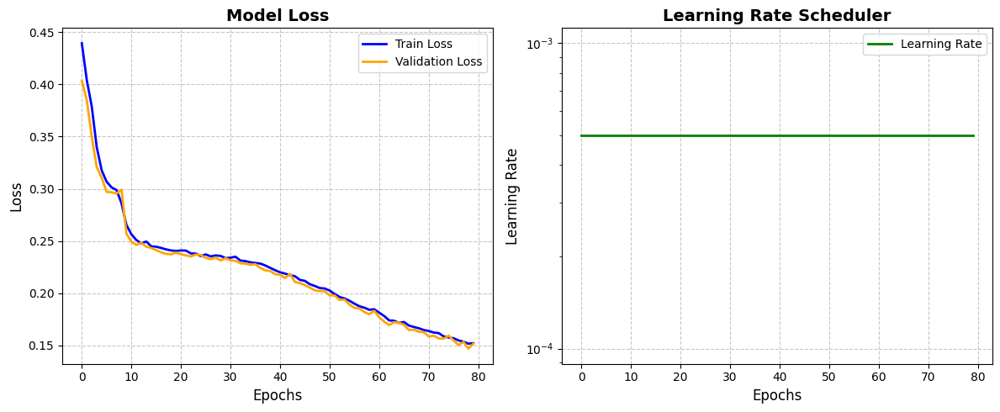

In [ ]:
REPO_PATH = '/content/drive/MyDrive/00gerem00/DL-AI-Project/'
SAVE_DIR = os.path.join(REPO_PATH, 'GridSearch_SSIM')
full_logs_json_path = os.path.join(SAVE_DIR, "full_training_logs.json")

with open(full_logs_json_path, "r") as f:
    full_histories = json.load(f)

best_config = "LR_0.0005_Win_5_Alpha_0.84"
history = full_histories[best_config]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.plot(history['train_loss'], label='Train Loss', color='blue', linewidth=2)
ax1.plot(history['val_loss'], label='Validation Loss', color='orange', linewidth=2)
ax1.set_title('Model Loss', fontsize=14, fontweight='bold')
ax1.set_xlabel('Epochs', fontsize=12)
ax1.set_ylabel('Loss', fontsize=12)
ax1.legend()
ax1.grid(True, linestyle='--', alpha=0.7)

ax2.plot(history['lr_evolution'], label='Learning Rate', color='green', linewidth=2)
ax2.set_title('Learning Rate Scheduler', fontsize=14, fontweight='bold')
ax2.set_xlabel('Epochs', fontsize=12)
ax2.set_ylabel('Learning Rate', fontsize=12)
ax2.set_yscale('log')
ax2.legend()
ax2.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

The plots above visualize the training trajectory of the optimal Fully Convolutional Autoencoder configuration (**LR: 0.0005, Window Size: $5 \times 5$, Alpha: 0.84**) during the initial 80 epoch experimental run. These graphs provide a clear technical justification for the subsequent decision to extend the training phase.

### **Model Loss Evaluation**

The first plot (Model Loss) reveals a distinct two-phase learning process. In the first 10 epochs, the loss drops steeply from an initial value of $0.4067$, reflecting the model’s rapid acquisition of the basic luminance and global spatial patterns of the leather surfaces. Between epoch 10 and 40, the descent becomes more gradual.

Interestingly, from epoch 40 onwards, the loss curve exhibits a slightly steeper negative gradient compared to the previous thirty epochs. This indicates that the model has transitioned into a refinement phase, focusing on high-frequency structural details. Crucially, at epoch 80, the trend is still clearly descending, reaching its minimum validation loss of **$0.1469$** at the very end of the run. The absence of an asymptotic plateau suggests that the network has not yet exhausted its learning capacity, and further optimization is required to reach true convergence.

### **Learning Rate Stability**

The second plot (Learning Rate Scheduler) shows that the learning rate remained constant at $\eta = 5 \cdot 10^{-4}$ throughout the entire 80 epoch duration. While the `ReduceLROnPlateau` scheduler was active, the validation loss continued to improve sufficiently enough within each `patience_sched` window (3 epochs) to avoid triggering a decay.

This stability, combined with the steadily decreasing loss, confirms that the initial learning rate was well effective for this specific optimization landscape. However, the fact that the scheduler never felt the need to slow down further proves that the model was still in an active state of descent at the moment the 80 epoch limit was reached.

### **Rationale for Extended Training**

The synergy between the persistent downward trend in the loss and the constant learning rate led to a critical design decision. To fully exploit the model's potential and ensure the latent space is as descriptive as possible for the subsequent classification task, we increased the training limit from to **250 epochs**.

This extension allows the Fully Convolutional Autoencoder to:

* Reach a Definitive Plateau: Ensuring the model settles into the deepest possible local minimum.
* Refine Structural Fidelity: Allowing more time for the SSIM-based loss to fine-tune the reconstruction of complex leather textures.
* Enable Scheduler Intervention: Providing enough temporal margin for the adaptive learning rate scheduler to trigger, which will guarantee the finer and more precise weight updates necessary for a perfectly calibrated latent representation.

## **Extended Final Training and Loss Decomposition Analysis**

Building upon the insights gained from the preliminary 80 epoch run, we executed a comprehensive training session with a maximum budget of 250 epochs. This phase utilized the optimal hyperparameter set (LR = $0.0005$, Window Size = $5 \times 5$, Alpha = $0.84$) to ensure the Model reached a state of definitive convergence.

In [ ]:
REPO_PATH = '/content/drive/MyDrive/00gerem00/DL-AI-Project/'
SAVE_DIR = os.path.join(REPO_PATH, 'Final_Training_Autoencoder')
os.makedirs(SAVE_DIR, exist_ok=True)

model = FullyConvAutoencoder().to(device)

best_lr = 0.0005
best_win_size = 5
best_alpha = 0.84

num_epochs = 250
patience_es = 10
patience_sched = 3

criterion = LeatherStructuralLoss(alpha=best_alpha, window_size=best_win_size)
optimizer = optim.Adam(model.parameters(), lr=best_lr)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=patience_sched
)

# Tracking metrics
best_val_loss = float("inf")
best_model_state = None
counter_es = 0

history = {
    'train_tot': [], 'train_ssim': [], 'train_l1': [],
    'val_tot': [], 'val_ssim': [], 'val_l1': [],
    'lr_evolution': [], 'epoch_duration': []
}

print(f"STARTING TRAINING: LR={best_lr}, Win={best_win_size}, Alpha={best_alpha}")
print("=" * 70)

for epoch in range(num_epochs):
    start_time = time.time()
    current_lr = optimizer.param_groups[0]['lr']
    history['lr_evolution'].append(current_lr)

    model.train()
    run_train_tot, run_train_ssim, run_train_l1 = 0.0, 0.0, 0.0
    total_train = 0

    for inputs, _ in train_loader:
        inputs = inputs.to(device)
        optimizer.zero_grad()

        outputs = model(inputs)

        # Unpack decomposed loss components
        loss_tot, loss_ssim, loss_l1 = criterion(outputs, inputs)

        # Backpropagate total loss
        loss_tot.backward()
        optimizer.step()

        # Accumulate metrics
        bs = inputs.size(0)
        run_train_tot += loss_tot.item() * bs
        run_train_ssim += loss_ssim.item() * bs
        run_train_l1 += loss_l1.item() * bs
        total_train += bs

    # Compute epoch averages
    train_tot = run_train_tot / total_train
    train_ssim = run_train_ssim / total_train
    train_l1 = run_train_l1 / total_train

    model.eval()
    run_val_tot, run_val_ssim, run_val_l1 = 0.0, 0.0, 0.0
    total_val = 0

    with torch.no_grad():
        for inputs, _ in val_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)

            loss_tot, loss_ssim, loss_l1 = criterion(outputs, inputs)

            bs = inputs.size(0)
            run_val_tot += loss_tot.item() * bs
            run_val_ssim += loss_ssim.item() * bs
            run_val_l1 += loss_l1.item() * bs
            total_val += bs

    # Compute epoch averages
    val_tot = run_val_tot / total_val
    val_ssim = run_val_ssim / total_val
    val_l1 = run_val_l1 / total_val

    # Log metrics
    duration = time.time() - start_time
    history['epoch_duration'].append(duration)
    history['train_tot'].append(train_tot)
    history['train_ssim'].append(train_ssim)
    history['train_l1'].append(train_l1)
    history['val_tot'].append(val_tot)
    history['val_ssim'].append(val_ssim)
    history['val_l1'].append(val_l1)

    # Step scheduler based on total validation loss
    scheduler.step(val_tot)

    print(f"Epoch [{epoch+1:3d}/{num_epochs}] - Time: {duration:.0f}s - LR: {current_lr:.6f}")
    print(f"  Train -> Tot: {train_tot:.4f} | (1-SSIM): {train_ssim:.4f} | L1: {train_l1:.4f}")
    print(f"  Val   -> Tot: {val_tot:.4f} | (1-SSIM): {val_ssim:.4f} | L1: {val_l1:.4f}")
    print("-" * 60)

    if val_tot < best_val_loss:
        best_val_loss = val_tot
        counter_es = 0
        best_model_state = copy.deepcopy(model.state_dict())

        save_path = os.path.join(SAVE_DIR, "AE_FINAL_OPTIMAL.pth")
        torch.save(best_model_state, save_path)
        print(f"  *** NEW GLOBAL RECORD! Best Val Loss: {best_val_loss:.4f} ***")
    else:
        counter_es += 1
        if counter_es >= patience_es:
            print(f"Convergence reached. Early Stopping triggered at epoch {epoch+1}.")
            break

history_path = os.path.join(SAVE_DIR, "final_training_history.json")
with open(history_path, "w") as f:
    json.dump(history, f, indent=4)

print("\nFINAL TRAINING COMPLETED.")
print(f"Optimal Validation Loss achieved: {best_val_loss:.4f}")
print(f"Model and metrics successfully exported to: {SAVE_DIR}")

STARTING TRAINING: LR=0.0005, Win=5, Alpha=0.84
Epoch [  1/250] - Time: 12s - LR: 0.000500
  Train -> Tot: 0.4358 | (1-SSIM): 0.4733 | L1: 0.2387
  Val   -> Tot: 0.4027 | (1-SSIM): 0.4356 | L1: 0.2301
------------------------------------------------------------
  *** NEW GLOBAL RECORD! Best Val Loss: 0.4027 ***
Epoch [  2/250] - Time: 12s - LR: 0.000500
  Train -> Tot: 0.4084 | (1-SSIM): 0.4415 | L1: 0.2343
  Val   -> Tot: 0.3956 | (1-SSIM): 0.4287 | L1: 0.2222
------------------------------------------------------------
  *** NEW GLOBAL RECORD! Best Val Loss: 0.3956 ***
Epoch [  3/250] - Time: 12s - LR: 0.000500
  Train -> Tot: 0.4037 | (1-SSIM): 0.4372 | L1: 0.2277
  Val   -> Tot: 0.3905 | (1-SSIM): 0.4237 | L1: 0.2159
------------------------------------------------------------
  *** NEW GLOBAL RECORD! Best Val Loss: 0.3905 ***
Epoch [  4/250] - Time: 12s - LR: 0.000500
  Train -> Tot: 0.4003 | (1-SSIM): 0.4342 | L1: 0.2223
  Val   -> Tot: 0.3915 | (1-SSIM): 0.4250 | L1: 0.2154
----

## **Extended Final Training Dynamics**

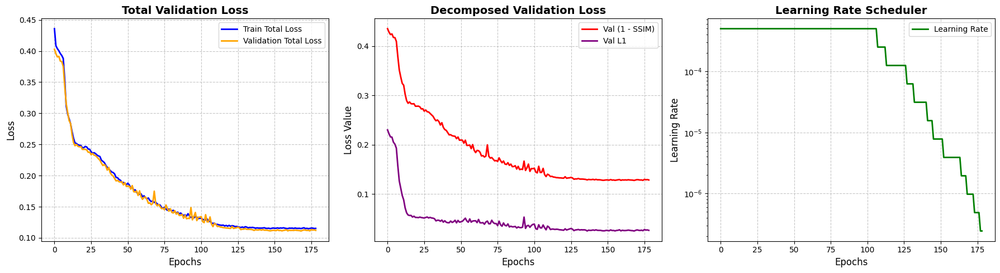

In [ ]:
REPO_PATH = '/content/drive/MyDrive/00gerem00/DL-AI-Project/'
SAVE_DIR = os.path.join(REPO_PATH, 'Final_Training_Autoencoder')
history_json_path = os.path.join(SAVE_DIR, "final_training_history.json")

with open(history_json_path, "r") as f:
    history = json.load(f)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

ax1.plot(history['train_tot'], label='Train Total Loss', color='blue', linewidth=2)
ax1.plot(history['val_tot'], label='Validation Total Loss', color='orange', linewidth=2)
ax1.set_title('Total Validation Loss', fontsize=14, fontweight='bold')
ax1.set_xlabel('Epochs', fontsize=12)
ax1.set_ylabel('Loss', fontsize=12)
ax1.legend()
ax1.grid(True, linestyle='--', alpha=0.7)

ax2.plot(history['val_ssim'], label='Val (1 - SSIM)', color='red', linewidth=2)
ax2.plot(history['val_l1'], label='Val L1', color='purple', linewidth=2)
ax2.set_title('Decomposed Validation Loss', fontsize=14, fontweight='bold')
ax2.set_xlabel('Epochs', fontsize=12)
ax2.set_ylabel('Loss Value', fontsize=12)
ax2.legend()
ax2.grid(True, linestyle='--', alpha=0.7)

ax3.plot(history['lr_evolution'], label='Learning Rate', color='green', linewidth=2)
ax3.set_title('Learning Rate Scheduler', fontsize=14, fontweight='bold')
ax3.set_xlabel('Epochs', fontsize=12)
ax3.set_ylabel('Learning Rate', fontsize=12)
ax3.set_yscale('log')
ax3.legend()
ax3.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


The three subplots above illustrate the optimization trajectory of the best performing Fully Convolutional Autoencoder during this final phase. By implementing a granular tracking system, we were able to visualize the convergence process in detail, demonstrating how the model progressed from learning basic global shapes to mastering the high-frequency structural patterns of the leather.

### **Total Loss Evaluation**

The left plot captures the macro-dynamics of the learning process. As shown, the training and validation curves remain remarkably synchronized throughout the 179 epochs. This lack of divergence is a strong indicator of the model's stability and its ability to generalize without falling into overfitting.

While our previous 80 epoch trial was forced to stop while the loss was still in a clear downward trend, this plot shows a much more mature trajectory. The total validation loss experienced a steep decline from an initial value of $0.4027$, continuing its descent well past the 100 epoch mark. A minimum Validation Loss of $0.1111$ was reached at epoch 169, after which the curve effectively flatlines. This definitive plateau safely justifies the termination of training via the Early Stopping mechanism at epoch 179, proving that the model achieved optimal convergence without diverging into an overfitting phase.

### **Decomposed Validation Loss Analysis**

The center plot allows us to isolate the two drivers of the reconstruction objective, defined by our custom function:


$$\text{Total Loss} = \alpha \cdot (1 - \text{SSIM}) + (1 - \alpha) \cdot \text{L1}$$


With $\alpha$ set to 0.84, the optimization is heavily weighted toward structural integrity. By observing the decomposed curves, we can clearly identify two distinct learning phases:

* **Initial Phase (Epochs 1-20)**: The purple curve ($L1$) exhibits a sharp drop. During this interval, the model quickly minimizes large errors to resolve the global luminance and the base color of the leather patches.
* **Refinement Phase (Epochs 20-179)**: The descent visibly transitions into a gentler, more specialized slope dictated by the red curve ($1 - \text{SSIM}$). The model shifts its focus to the precise reconstruction of high-frequency leather details.

This specific behavior explains why the initial 80 epoch run was insufficient: the structural similarity component requires a significantly higher number of iterations to align fine-grained texture patterns. At the optimal point (epoch 169), the components reached $0.1275$ for $(1-\text{SSIM})$ and $0.0249$ for $L1$. The dominance of the structural term confirms that the Autoencoder successfully prioritized perceptual quality and texture fidelity.

### **Impact of the Learning Rate Scheduler**

The right plot illustrates the perfect synergy between the `Adam` optimizer and the `ReduceLROnPlateau` scheduler. Training began at a constant $\eta = 5 \cdot 10^{-4}$ and remained steady for the first ~100 epochs.

Unlike the shorter trial where the learning rate never changed, this extended run shows multiple step-wise reductions (factor = $0.5$) triggered whenever the validation loss began to stagnate. These decays, clearly visible on the log-scale, reduced the step size down to the order of $10^{-7}$. These microscopic adjustments allowed the optimizer to "cool down" and navigate the narrowest regions of the loss landscape, enabling the network to perform the micro-tuning necessary to securely lock in the fine structural features.

### **Performance Results and Final Metrics**
This synergy between the loss decomposition and the adaptive scheduling ensured that the model did not just stop because it ran out of time, but because it had truly settled into its deepest local minimum. The resulting model, saved as `AE_FINAL_OPTIMAL.pth`, now possesses a highly refined Encoder. As evidenced by the final metrics, this component has effectively learned to compress complex leather textures into a latent space that is both structurally accurate and rich in discriminative features, providing a robust foundation for the subsequent classification task.

## **Reconstructed Images Gallery**

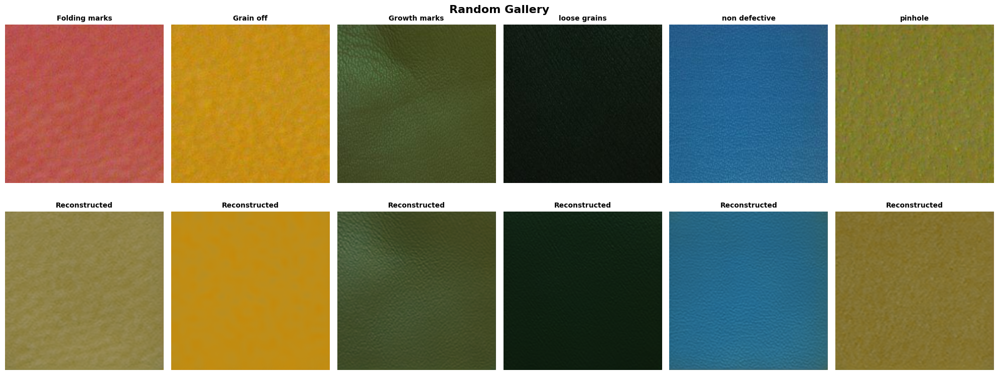

In [ ]:
class_names = dataset.classes

def visualize_random_per_class(model_path, dataloader, device):

    # Initialize and load model weights
    model = FullyConvAutoencoder().to(device)

    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path, map_location=device))
    else:
        print(f"Error: File {model_path} not found.")
        return

    model.eval()

    found_images = {}
    dataset_obj = dataloader.dataset
    indices = list(range(len(dataset_obj)))

    # Shuffle indices to ensure stochastic selection at each run
    random.shuffle(indices)

    # Isolate exactly one random image per class
    for idx in indices:
        img, lbl = dataset_obj[idx]
        if lbl not in found_images:
            found_images[lbl] = img

        # Stop condition: all classes collected
        if len(found_images) == len(class_names):
            break

    # Sort by class index for consistent plotting order
    sorted_labels = sorted(found_images.keys())
    display_images = torch.stack([found_images[l] for l in sorted_labels]).to(device)

    # Forward pass (Reconstruction)
    with torch.no_grad():
        reconstructed = model(display_images)

    # Plotting configuration
    num_classes = len(class_names)
    plt.figure(figsize=(20, 8))

    for i in range(num_classes):
        label_idx = sorted_labels[i]

        # --- ORIGINAL IMAGE ---
        plt.subplot(2, num_classes, i + 1)
        img_orig = display_images[i].cpu().numpy().transpose((1, 2, 0))
        img_orig = np.clip(img_orig, 0, 1)
        plt.imshow(img_orig)
        plt.title(f"{class_names[label_idx]}", fontsize=10, fontweight='bold')
        plt.axis('off')

        # --- RECONSTRUCTED IMAGE ---
        plt.subplot(2, num_classes, i + 1 + num_classes)
        img_recon = reconstructed[i].cpu().numpy().transpose((1, 2, 0))
        img_recon = np.clip(img_recon, 0, 1)
        plt.imshow(img_recon)
        plt.title(f"Reconstructed {class_names[label_idx]}", fontsize=10, fontweight='bold')
        plt.axis('off')

    plt.tight_layout()
    plt.suptitle("Random Gallery", fontsize=16,  fontweight='bold')
    plt.show()

best_model_file = os.path.join(SAVE_DIR, "AE_FINAL_OPTIMAL.pth")
visualize_random_per_class(best_model_file, test_loader, device)

To complement the quantitative metrics, we performed a qualitative visual inspection of our optimal model (`AE_FINAL_OPTIMAL.pth`). By randomly selecting exactly one unseen image per category from the Test Set, we can visually compare the ground-truth originals against the network's reconstructions.

It is crucial to underline the strictly unsupervised methodology of this process. The Autoencoder was optimized solely to minimize the mathematical difference between input and output representations, completely blind to the actual class labels. It relies entirely on the descriptive power of its Encoder to compress the visual input into the bottleneck, and the Decoder to rebuild it from that latent space.

The autoencoder maintains strong consistency with the original samples in terms of color distribution and surface shading. The model accurately reproduces dominant chromatic characteristics, confirming that the encoder has successfully learned to map low-frequency components. This ensures that pixel intensity, monitored by the $L1$ component of the loss, remains faithful to the original.

However, in specific samples like *Folding marks*, the reconstructed color may not be perfectly identical to the original. This discrepancy is a direct consequence of our optimization strategy. With $\alpha = 0.84$, the $\text{SSIM}$ component dominates the Loss, meaning the model prioritizes structural relationships over absolute RGB precision. Additionally, the bottleneck of the Autoencoder acts as a low-pass filter; since *Folding marks* often feature sharp chromatic shifts due to mechanical compression, the model may reconstruct a smoothed version of the color while preserving the structural signature of the defect.

The most significant aspect concerns the ability to recover the micro-texture typical of leather surfaces. In *Growth marks*, *loose grains*, and *non defective samples*, the reconstructions preserve the granular patterns that define the leather's structure.

This result is tangible evidence of the weight given to the $\text{SSIM}$ component during the final training. By prioritizing structural similarity over simple single-pixel precision, the optimization encouraged the model to maintain the continuity of local spatial relationships.

Despite the high fidelity, a slight smoothing effect is observed in some reconstructions. This behavior is intrinsic to the Fully Convolutional nature of the architecture. During compression into the latent space, very high-frequency stochastic variations, often interpretable as noise, are partially filtered out in favor of dominant structural features.

This filtering is not a limitation but rather a strategic advantage. In leather defect detection, identifying the structural signature (e.g., the physical presence of a hole or a fold) is vastly more robust for classification than matching every noisy pixel variation. By producing a cleaner, denoised representation, the autoencoder creates an ideal input for the subsequent classification stage.

### **Partial Conclusions**
In summary, the reconstruction gallery demonstrates that the autoencoder has reached the desired convergence. The model does not merely replicate the image; it understands its internal structure, succeeding in compressing complex information without losing the essential characteristics of the different classes.

This qualitative evidence, combined with the final Validation Loss ($0.1111$), validates the Encoder as a reliable feature extractor. Even if slight chromatic shifts occur in the most complex defects, the structural integrity remains perfectly intact, providing a robust foundation for our upcoming Transfer Learning task.

# **Transfer Learning for Classification**

### **Theoretical Foundations**

Transfer Learning is a machine learning paradigm based on the idea of exploiting knowledge acquired by a model while solving a specific task (Task A) to improve learning in a second, related task (Task B).

In traditional deep learning, models often require massive amounts of labeled data to learn from scratch. However, in specialized domains such as industrial diagnostics or material science, acquiring large datasets can be prohibitive. Transfer Learning overcomes this challenge by allowing the model to start not from a tabula rasa, but from a foundation of pre extracted hierarchical features.

### **Historical Origins**

While the concept of knowledge transfer has roots in the psychology of learning, its formalization within Artificial Intelligence is attributed to several key figures:

* L.Y. Pratt (1993): One of the first to formalize the concept of Discriminability-Based Transfer (DBT), demonstrating how weights from a pre-trained neural network could significantly accelerate the learning process of a new network.
* Pan and Yang (2010): Their landmark paper, *"A Survey on Transfer Learning"*, is considered the cornerstone that defined modern taxonomy (Inductive, Transductive, and Unsupervised Transfer Learning), providing the theoretical framework used in this project.
* Bengio (2012): Yoshua Bengio expanded on the link between Transfer Learning and Representation Learning, theorizing how deep networks learn hierarchical features (from simple edges to complex textures) that are inherently transferable across different tasks.

### **Unsupervised Task Adaptation**

In this project, we applied Transfer Learning following an Unsupervised Pre-training (or Self-Supervised) approach, as theorized by Erhan et al. (2010) in their study *"Why Does Unsupervised Pre-training Help Deep Learning?"*.

* Source (Task A - Reconstruction): The Autoencoder was trained to reconstruct leather images. During this phase, the Encoder extracted structural features of the leather without the need for labels, effectively learning the distribution of the material.
* Target (Task B - Classification): We reuse the Encoder as a feature extractor. As demonstrated by Yosinski et al. (2014) in *"How transferable are features in deep neural networks?"*, the initial layers of convolutional networks learn general features that can be "frozen" for specific classification tasks, drastically reducing the risk of overfitting.

### **Implementation**

There are two primary modes for implementing Transfer Learning in this context:

* Feature Extraction (Encoder Frozen): The encoder's weights are locked. The model transforms the input into a high-level feature vector, which is then processed by a new classification head composed of fully connected layers.
* Fine-Tuning (Encoder Unfrozen): After an initial training phase of the head, the encoder's weights are unlocked and refined with a very low learning rate to better adapt to the decision boundaries of the specific defect classes.


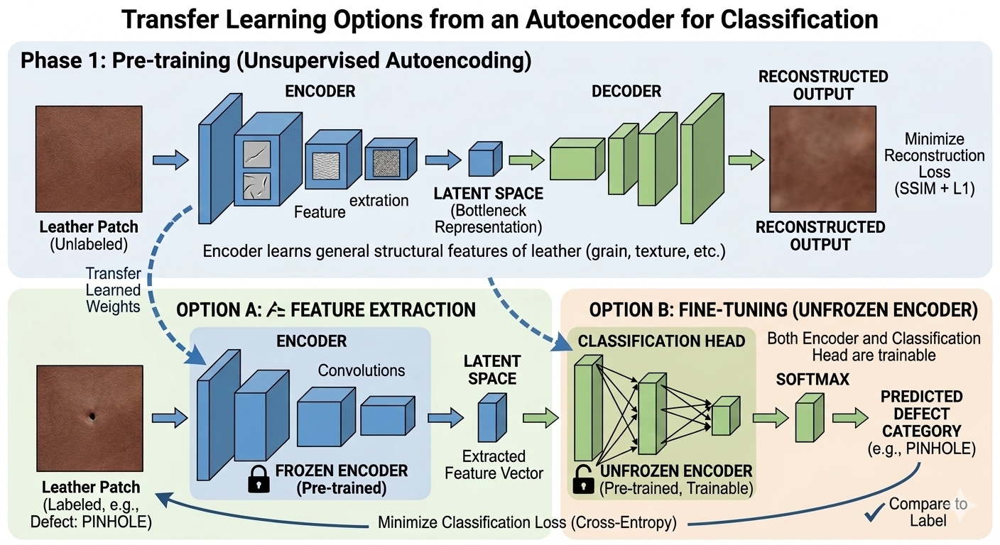

## **Data Preprocessing & Data Augmentation**

To ensure the robustness of the new classifier and facilitate a fair evaluation, we maintained the core Data Augmentation strategy established in our previous `CustomResNet18` baseline.

The `train_classify_transform` pipeline reuses the exact same spatial, geometric, and photometric operations (`Resize` to $230 \times 230$, `RandomCrop` to $224 \times 224$, `RandomHorizontalFlip`, `RandomRotation`, and `ColorJitter`). As detailed in the previous model, these operations artificially increase dataset variability, preventing the network from memorizing positional noise and forcing it to focus on the invariant structural signatures of the leather defects.

For the validation and test sets, we also maintain strict data integrity using `val_test_classify_transform`, performing only a direct resize to $224 \times 224$ and a `ToTensor()` conversion to ensure a deterministic evaluation on unseen samples.

While the geometric augmentations remain identical, a critical distinction exists in our normalization strategy. In the `CustomResNet18` baseline, we applied `transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])`. This mathematically shifted the pixel values from the standard **[0.0, 1.0]** float range to a **[-1.0, 1.0]** range. However, for this Transfer Learning classifier, the normalization step was deliberately removed for two technical reasons:

1. Encoder Consistency: The Autoencoder was unsupervisedly pre-trained on raw pixel values (scaled to [0.0, 1.0] range) to correctly calculate the structural and absolute error losses. Since we are now directly reusing the frozen weights of that exact Encoder, we must feed it data that perfectly follows the distribution it has already mastered.
2. Avoiding Feature Shift: Applying a new normalization step would drastically alter the input statistics. This would cause the pre-trained network to yield erratic and misaligned activations, as the input data would no longer align with the hierarchical features meticulously learned during the 179 epochs of pre-training.

In [ ]:
train_classify_transform = transforms.Compose([
    transforms.Resize((230, 230)),
    transforms.RandomCrop((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.15, contrast=0.12),
    transforms.ToTensor()
])

val_test_classify_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

train_final = TransformSubset(train_set, transform=train_classify_transform)
val_final = TransformSubset(val_set, transform=val_test_classify_transform)
test_final = TransformSubset(test_set, transform=val_test_classify_transform)

batch_size = 32

train_loader = DataLoader(train_final, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_final, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_final, batch_size=batch_size, shuffle=False)

## **Restoration of Pre-Trained Weights**

The transition from the unsupervised reconstruction task to the supervised classification phase is anchored entirely by the restoration of the Autoencoder's pre-trained state. By loading the weights from our optimal checkpoint (`AE_FINAL_OPTIMAL.pth`), we ensure the new classifier fully leverages the structural "knowledge" acquired during the extensive pre-training cycle.

The implementation executes the recovery of the model's internal parameters through two precise steps:

* Checkpoint Localization: Using `os.path.join`, the code targets the saved `state_dict`, the exact mathematical dictionary of learned weights and biases that achieved the highest structural fidelity during the reconstruction phase.
* Knowledge Recovery: By executing `base_ae.load_state_dict(torch.load(..., map_location=device))`, these saved tensors are injected into the uninitialized architecture. This critical step transforms the convolutional filters from random mathematical noise into specialized sensors highly calibrated to identify leather specific textures and anomalies.

This specific weight-loading strategy provides two fundamental advantages for the subsequent Transfer Learning task:

* Initialization: Instead of a traditional start (where a model begins with randomized weights), the network initiates its classification training from a point in the parameter space that is already deeply optimized for leather surface representation. This significantly accelerates convergence on the new target task.
* Preservation of Learned Representations: The restoration guarantees the Encoder retains its ability to extract high level semantic features. It can immediately process complex input data into a dense, meaningful latent representation, drastically reducing the computational effort required by the new classification head.

Ultimately, this initialization is the strict prerequisite for all subsequent operations. By completely restoring the optimal state of `base_ae` before detaching its Encoder, we guarantee that our feature extractor is a component possessing a deep understanding of the material visual characteristics.

In [ ]:
REPO_PATH = '/content/drive/MyDrive/00gerem00/DL-AI-Project/'
SAVE_DIR_AE = os.path.join(REPO_PATH, 'Final_Training_Autoencoder')
ae_checkpoint_path = os.path.join(SAVE_DIR_AE, "AE_FINAL_OPTIMAL.pth")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

base_ae = FullyConvAutoencoder().to(device)

base_ae.load_state_dict(torch.load(ae_checkpoint_path, map_location=device))

<All keys matched successfully>

## **Classification Strategy**

With the encoder successfully pre-trained and its optimal weights fully restored, the structural "bridge" connecting the unsupervised representation learning to our new supervised classification task is the final output of the bottleneck: a dense latent tensor with dimensions of $14 \times 14 \times 64$.

The primary architectural challenge at this stage was determining exactly how to attach a classification head to this specific representation. To map these highly compressed, spatial feature maps to our six distinct leather categories, the 3D tensor must first be flattened. This operation unwrolls the $14 \times 14 \times 64$ grid into a massive, single-dimensional vector of exactly $12,544$ features.

Connecting a neural network head to an input space of this magnitude presents immediate risks, primarily concerning parameter explosion and the resulting likelihood of severe overfitting. Rather than immediately designing a deep, complex multi-layer perceptron, we adopted a methodical, iterative experimental strategy to carefully evaluate the optimal architecture.

To navigate this architectural challenge and systematically address the risk of parameter explosion, we structured our design phase into a series of progressive experiments. The following roadmap outlines the iterative steps taken to build, evaluate, and refine the classification head:


* **Phase 1: The Linear Baseline**: Our initial approach was to attach a simple, unregularized linear layer directly to the flattened $12,544$, dimensional vector. The goal here was not to achieve production-level accuracy, but to establish a fundamental baseline. This allowed us to assess the raw, inherent linear separability of the features extracted by the frozen encoder before introducing any structural complexity.
* **Phase 2: MLP v1 with Aggressive Regularization**:
Recognizing the limitations of a purely linear decision boundary for complex textures, we introduced a Multi-Layer Perceptron (MLP) with hidden layers. To explicitly combat the massive parameter count and prevent instant memorization, we integrated ReLU activations, Batch Normalization for internal stability, and an aggressive Dropout strategy. Specifically, we applied a heavy dropout probability of $p=0.5$ in the first hidden layer and $p=0.3$ in the second, forcing the network to learn highly robust and redundant representations.
* **Phase 3: MLP v2 with Refined Regularization**:
While aggressive dropout is excellent for preventing overfitting, it can sometimes constrain the network's learning capacity too severely. In this third iteration, we designed a "v2" MLP by lowering the dropout probabilities ($p=0.3$ and $p=0.1$). The objective of this phase was to empirically find the optimal balance, granting the model enough representational freedom to capture subtle defect variations while maintaining sufficient regularization.
* **Phase 4: End-to-End Fine-Tuning**:
For the final phase, after identifying the optimal classification head architecture, we moved beyond the strict feature extraction paradigm. We selectively unfroze the pre-trained encoder, lowering the learning rate significantly, to perform end-to-end fine-tuning.  This allowed the previously frozen structural filters to gently adapt to the specific decision boundaries of our six target defect categories.

Across all four Transfer Learning experiments, we evaluated and saved the optimal models based strictly on Validation Accuracy rather than Validation Loss (the metric used for our ResNet-18 baseline). Given the massive parameter space of our flattened input ($12,544$ features), these dense classification heads could be susceptible to probability skewing. They quickly become overconfident on the training data, which severely penalizes the Cross-Entropy equation. This would cause the Validation Loss curve to artificially inflate and diverge early, even while the actual hard predictions (Validation Accuracy) continue to improve or remain stable. Therefore, raw Accuracy serves as a much more robust and reliable metric for evaluating the classifier true geometric decision boundaries.


### **Flattening vs. Global Average Pooling (GAP)**

Before detailing the results of Phase 1, it is necessary to justify a fundamental architectural divergence from our previous `CustomResNet18` baseline.

In the ResNet architecture, the transition from convolutional layers to the final classification head is mediated by an `AdaptiveAvgPool2d` (Global Average Pooling or GAP) layer. GAP calculates the spatial average across each feature map, drastically compressing the tensor into a compact, manageable vector (e.g., 512 elements). This operation is instrinsic of the ResNet paradigm: it is highly parameter-efficient and acts as a built-in structural regularizer against overfitting during end-to-end supervised training.

However, for our Transfer Learning classification head, we deliberately bypassed the GAP approach in favor of a direct `Flatten` operation. The justification lies in the distinct nature of our unsupervised pre-training:

1. Fidelity to the Latent Space: Our Autoencoder spent 179 epochs meticulously optimizing a specific, dense latent space structure ($14 \times 14 \times 64$). Applying a spatial average over this bottleneck would forcefully collapse the $196$ ($14 \times 14$) spatial cells into a single value per channel. This would prematurely aggregate and distort the nuanced feature distribution that the unsupervised phase worked so hard to encode.
2. Feature Access: By flattening the tensor into $12,544$ distinct features, we ensure the new classification head has direct, unfiltered access to the exact, unaltered representation learned by the Autoencoder.

While the ResNet GAP is excellent for parameter efficiency when training from scratch, our Transfer Learning strategy prioritizes maximum fidelity to the pre-trained bottleneck. We consciously accepted the architectural challenge of managing a massive parameter space, which we address in Phases 2 and 3 via aggressive regularization, in order to fully exploit the raw representational power of the Autoencoder.

### **Hybrid Weight Initialization**

Moreover, it is crucial to define the exact starting state of this composite architecture. We employed a dual initialization strategy to bridge the pre-trained representations with the untrained classification layers:

* The Frozen Encoder: The spatial convolutional filters were explicitly loaded with the optimal, pre-trained weights carefully acquired during the 179-epoch unsupervised Autoencoder training phase. This guarantees the preservation of the highly specialized latent space.
* The Classification Head: Conversely, the newly appended `nn.Linear` layers required initialization from scratch. For these dense layers, we relied on PyTorch’s native default initialization. Under the hood, PyTorch initializes linear layers using a bounded uniform distribution $\mathcal{U}\left(-\frac{1}{\sqrt{n_{\text{in}}}}, \frac{1}{\sqrt{n_{\text{in}}}}\right)$, which traces its theoretical roots back to LeCun Initialization.

When connecting a massive flattened vector (in our case, $n_{\text{in}} = 12,544$ features) to a dense neuron, the output variance risks exploding. Mathematically, the variance of a linear combination of inputs grows linearly with the number of inputs. To prevent early saturation, LeCun established that the variance of the initial weights must be inversely proportional to the number of incoming connections ($n_{\text{in}}$).

To achieve this, PyTorch's default implementation dynamically bounds the uniform distribution $a$ based on the fan-in ($n_{\text{in}}$). By setting $a = \frac{1}{\sqrt{n_{\text{in}}}}$, the framework ensures that as the layer width increases, the initial weights are squeezed tighter around zero. Consequently, the weights $W$ are sampled from:

$$W \sim \mathcal{U}\left(-\frac{1}{\sqrt{n_{\text{in}}}}, \frac{1}{\sqrt{n_{\text{in}}}}\right)$$

**Structural Alignment across the Iterative Phases**

While this LeCun inspired initialization is highly effective for bounding initial linear combinations, it was historically designed for symmetric activation functions. As previously discussed in our Custom ResNet-18 baseline, pairing this default initialization with asymmetric **ReLU** activations theoretically results in a $50$% variance decay per layer, an issue typically solved by enforcing He (Kaiming) initialization.

To address this theoretical conflict, this default initialization interacted differently with our classification heads depending on the specific experimental phase:

* In the Linear Baseline (Phase 1): The architecture consists of a sequence of `nn.Linear` layers mapping the flattened vector to the final output logits. Crucially, this unregularized baseline do not employ any non-linear activation functions (e.g., ReLU) between the dense layers. While physically constructed of multiple matrices, this deep linear structure mathematically collapses into a single linear transformation. Because of this absence of asymmetric activations, the network is immune to variance decay. Therefore, the LeCun uniform initialization applied natively by PyTorch to each weight matrix can be considered sufficient to stabilize the initial linear combinations without requiring any modifications.
* In the Deep MLP (Phase 2 and 3): The introduction of hidden layers requires ReLU activations, creating the previously conflict with the LeCun initialization. However, our MLP architectures mitigated this necessity structurally. By inserting `nn.BatchNorm1d` layers immediately following every linear transformation and before the ReLU activations, the network forcefully intercepts the signal. Batch Normalization recalculates and standardizes the internal covariate shift across the mini batch, resetting the variance back to a stable scale. This ensures that the signal variance remains strictly controlled before passing through the ReLU threshold, allowing the layers to safely adapt to the  12544-dimensional latent vector without suffering from vanishing gradients.







> To maintain the flow and readability of this report, we have elected to omit the full Python implementation for the first two experiments (Linear Baseline Classifier and MLP v1). This approach avoids redundancy while highlighting the progressive architectural refinements and their impact on the final accuracy.

### **Phase 1: Linear Baseline**

The first step in our classification strategy was to establish a rigorous performance baseline. We defined the `LeatherLinearClassifier`. The goal is to measure the raw quality of the frozen encoder's output. The core philosophy of this experiment was strictly maintaining linearity:

* Encoder Freezing: We explicitly froze the pre-trained autoencoder parameters (`param.requires_grad = False`). This ensured that the feature extraction pipeline remained static, forcing the new classification head to work exclusively with the representations learned during the unsupervised phase.
* Purely Linear Head: The classifier was constructed using a sequence of fully connected layers (`nn.Linear`), flattening the $64 \times 14 \times 14$ latent tensor down to $2048$, then $256$, and finally to the $6$ target classes.
* Absence of Non-Linearity: Crucially, we intentionally omitted activation functions and regularization techniques.

The goal is to measure the raw quality of the frozen encoder's output and justify the need for the advanced architecture that follows.

**Training Configuration**

* Learning Rate: the initial learning rate was deliberately set to $10^{-4}$, informed by the empirical evidence gathered during our earlier exhaustive Grid Search on the Custom ResNet-18.
* Optimizer: Adam.
* Gradient Isolation: We passed only the parameters of the newly added linear head (`classifier_model.classifier.parameters()`) to the optimizer, strictly preserving the encoder's weights.
* Loss Function: Standard Cross-Entropy Loss (`nn.CrossEntropyLoss()`) for multi-class classification.
* Epoch Duration: 40 (for the other phases we imposed a maximum of 80 epochs).

**Results and Analysis**

By analyzing the training history (`clf_baseline_history.json`), we observed the following behaviors:

* Peak Performance: The model reached its maximum Validation Accuracy of 62.04% at Epoch 32.
* Training Dynamics: The Training Accuracy hovered around $50\%$ to $53\%$, and the Validation Loss quickly stabilized around $1.00$ without further significant improvements.

In conclusion we can say that the $62.04\%$ Validation Accuracy acts as a solid mathematical baseline. However, it clearly indicates that the features representing different leather defects are not perfectly linearly separable. To cross the complex decision boundaries between these morphological flaws, the classification head required greater expressive power.

In [ ]:
REPO_PATH = '/content/drive/MyDrive/lorenzomeroni02/DL-AI-Project/'
SAVE_DIR_CLF = os.path.join(REPO_PATH, 'Final_Training_Classifier_Baseline')
file_path = os.path.join(SAVE_DIR_CLF, "clf_baseline_history.json")

with open(file_path, 'r') as f:
    history = json.load(f)

best_val_acc = max(history['val_acc'])
best_epoch = history['val_acc'].index(best_val_acc) + 1

print(f"Best Validation Accuracy (Linear Classifier): {best_val_acc:.2f}%")
print(f"Achieved at Epoch: {best_epoch}")

Best Validation Accuracy (Linear Classifier): 62.04%
Achieved at Epoch: 32



### **Phase 2: MLP Classifier v1**

Following the baseline evaluation, it became evident that classifying complex, subtle morphological defects required more than a simple linear transformation. To capture higher-order patterns in the latent space, we advanced to Phase 2, replacing the linear probe with a deep Multi-Layer Perceptron (MLP) architecture: the `LeatherMLPClassifier`..

However, the introduction of dense hidden layers, specifically mapping the flattened $12,544$ input features to a 2048 neuron layer, followed by a 256 neuron layer, creates a massive weight matrix exceeding 25 million parameters. This inherently risks severe overfitting. To mitigate this, we introduced three critical structural enhancements into the `Sequential` classification head:

1. **Non-Linear Activations (ReLU):** Inserted after each dense block, these activations allow the network to establish the complex, non-linear decision boundaries necessary to distinguish between visually similar defect classes.
2. **Batch Normalization (`BatchNorm1d`):** Applied immediately before the ReLU activations, this standardizes the inputs to each layer. Given the massive dimensionality of the flattened vector, Batch Normalization stabilizes internal covariate shift, prevents gradients from exploding, and significantly accelerates convergence.
3. **Aggressive Dropout Strategy:** To directly handle the parameter explosion, we implemented severe dropout penalties. We applied a $50\%$ dropout rate (`p=0.5`) after the massive 2048 neuron layer, and a $30\%$ rate (`p=0.3`) after the 256 neuron layer. By randomly zeroing out activations during training, we force the network to learn highly redundant, distributed representations, preventing it from relying on a small subset of memorized neurons.

**Optimization Strategy**

Again, we configured the Learning Rate Scheduler (`ReduceLROnPlateau`): the scheduler dynamically halves the learning rate (factor = $0.5$)if the accuracy plateaus for 4 epochs, allowing the model to make finer weight adjustments as it approaches the global minimum.


**Results and Analysis**

The data extracted from the training logs (`clf_mlp_history.json`) confirms the validity of these choices:

* Best Validation Accuracy: $83.15$% (Epoch 38).
* Corresponding Training Accuracy: $69.06$%.
* We observe a significant negative gap (-$14.09$%), where Validation Accuracy is considerably higher than Training Accuracy.

This anomaly is driven directly by our aggressive Dropout strategy (`p=0.5` and `p=0.3`). During the training phase, the network is forced to make complex classifications with up to half of its neurons randomly deactivated. Consequently, its training performance remains artificially suppressed ($69.06$%). During the validation phase, however, Dropout is completely deactivated (`model.eval()`). The network suddenly has access to its full, unhindered ensemble of weights, causing the accuracy to experience a massive spike ($83.15$%).

In [ ]:
REPO_PATH = '/content/drive/MyDrive/00gerem00/DL-AI-Project/'
SAVE_DIR_MLP = os.path.join(REPO_PATH, 'Final_Training_Classifier_MLP')
file_path = os.path.join(SAVE_DIR_MLP, "clf_mlp_history.json")

with open(file_path, 'r') as f:
    history_mlp = json.load(f)

best_val_acc_mlp = max(history_mlp['val_acc'])
best_index = history_mlp['val_acc'].index(best_val_acc_mlp)
best_epoch_mlp = best_index + 1

corresponding_train_acc = history_mlp['train_acc'][best_index]
gap = corresponding_train_acc - best_val_acc_mlp

print(f"Best Validation Accuracy (MLP Classifier v1): {best_val_acc_mlp:.2f}%")
print(f"Corresponding Training Accuracy: {corresponding_train_acc:.2f}%")
print(f"Accuracy Gap (Train - Val): {gap:.2f}%")
print(f"Achieved at Epoch: {best_epoch_mlp}")

Best Validation Accuracy (MLP Classifier v1): 83.15%
Corresponding Training Accuracy: 69.06%
Accuracy Gap (Train - Val): -14.09%
Achieved at Epoch: 38


### **Phase 3: MLP Classifier v2**

To unlock the network's full potential, a structural calibration is required. We lower the droput probabilities to grant the dense layers the mathematical freedom required to properly converge on the training data, ideally elevating both the training and validation accuracies while maintaining just enough regularization to keep the parameter space stable.

**Dropout Evolution**

The architecture of `LeatherMLPClassifier_v2` was identical to the previous version, with only a targeted reduction in Dropout coefficients:

* First Dense Block: Dropout Probability reduced from $0.5$ to $0.3$.
* Second Dense Block: Dropout Probability reduced from $0.3$ to $0.1$.




In [ ]:
class LeatherMLPClassifier_v2(nn.Module):
    def __init__(self, encoder, num_classes=6):
        super(LeatherMLPClassifier_v2, self).__init__()
        self.encoder = encoder

        for param in self.encoder.parameters():
            param.requires_grad = False

        self.classifier = nn.Sequential(
            nn.Flatten(),

            nn.Linear(64 * 14 * 14, 2048),
            nn.BatchNorm1d(2048),
            nn.ReLU(),
            nn.Dropout(0.3), # Was 0.5

            nn.Linear(2048, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.1), # Was 0.3

            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.encoder(x)
        logits = self.classifier(features)
        return logits

In [ ]:
mlp_classifier = LeatherMLPClassifier_v2(base_ae.encoder, num_classes=6).to(device)

criterion = nn.CrossEntropyLoss()

optimizer_mlp = optim.Adam(mlp_classifier.classifier.parameters(), lr=1e-4)

scheduler_mlp = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_mlp, mode='max', factor=0.5, patience=4
)

In [ ]:
SAVE_DIR_MLP_V2 = os.path.join(REPO_PATH, 'Final_Training_Classifier_MLP_V2')
os.makedirs(SAVE_DIR_MLP_V2, exist_ok=True)

num_epochs_mlp = 80
early_stopping_patience = 10
epochs_no_improve = 0

best_val_acc_mlp = 0.0
best_mlp_state = None

history_mlp_v2 = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': [], 'lr_evolution': []
}

print("STARTING MLP CLASSIFIER TRAINING - VERSION 2")
print("=" * 70)

for epoch in range(num_epochs_mlp):
    start_time = time.time()
    current_lr = optimizer_mlp.param_groups[0]['lr']
    history_mlp_v2['lr_evolution'].append(current_lr)

    # TRAINING PHASE
    mlp_classifier.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0

    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer_mlp.zero_grad()

        outputs = mlp_classifier(inputs)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer_mlp.step()

        running_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_loss = running_loss / total_train
    train_acc = correct_train / total_train

    # VALIDATION PHASE

    mlp_classifier.eval()
    running_val_loss = 0.0
    correct_val = 0
    total_val = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = mlp_classifier(inputs)
            loss = criterion(outputs, labels)

            running_val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()

    val_loss = running_val_loss / total_val
    val_acc = correct_val / total_val

    history_mlp_v2['train_loss'].append(train_loss)
    history_mlp_v2['train_acc'].append(train_acc * 100)
    history_mlp_v2['val_loss'].append(val_loss)
    history_mlp_v2['val_acc'].append(val_acc * 100)

    scheduler_mlp.step(val_acc)

    duration = time.time() - start_time
    print(f"Epoch [{epoch+1:2d}/{num_epochs_mlp}] - Time: {duration:.0f}s - LR: {current_lr:.6f}")
    print(f"  Train -> Loss: {train_loss:.4f} | Accuracy: {train_acc*100:.2f}%")
    print(f"  Val   -> Loss: {val_loss:.4f} | Accuracy: {val_acc*100:.2f}%")
    print("-" * 30)

    if val_acc > best_val_acc_mlp:
        best_val_acc_mlp = val_acc
        best_mlp_state = copy.deepcopy(mlp_classifier.state_dict())

        save_path = os.path.join(SAVE_DIR_MLP_V2, "CLF_MLP_V2_OPTIMAL.pth")
        torch.save(best_mlp_state, save_path)

        print(f"   *** NEW GLOBAL RECORD! Best Val Acc: {best_val_acc_mlp*100:.2f}% ***")

        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

        if epochs_no_improve >= early_stopping_patience:
            print(f"Early Stopping triggered at epoch {epoch+1}.")
            break

history_path = os.path.join(SAVE_DIR_MLP_V2, "clf_mlp_v2_history.json")
with open(history_path, "w") as f:
    json.dump(history_mlp_v2, f, indent=4)

print("\nMLP TRAINING FINISHED")
print(f"Global Best Val Acc: {best_val_acc_mlp*100:.2f}%")
print(f"All files saved in: {SAVE_DIR_MLP_V2}")

STARTING MLP CLASSIFIER TRAINING - VERSION 2
Epoch [ 1/80] - Time: 14s - LR: 0.000100
  Train -> Loss: 0.9042 | Accuracy: 63.07%
  Val   -> Loss: 0.7871 | Accuracy: 75.00%
------------------------------
   *** NEW GLOBAL RECORD! Best Val Acc: 75.00% ***
Epoch [ 2/80] - Time: 13s - LR: 0.000100
  Train -> Loss: 0.8857 | Accuracy: 62.23%
  Val   -> Loss: 0.7891 | Accuracy: 69.81%
------------------------------
Epoch [ 3/80] - Time: 13s - LR: 0.000100
  Train -> Loss: 0.8972 | Accuracy: 61.91%
  Val   -> Loss: 0.7700 | Accuracy: 73.15%
------------------------------
Epoch [ 4/80] - Time: 13s - LR: 0.000100
  Train -> Loss: 0.8513 | Accuracy: 65.57%
  Val   -> Loss: 0.7163 | Accuracy: 75.00%
------------------------------
Epoch [ 5/80] - Time: 13s - LR: 0.000100
  Train -> Loss: 0.8491 | Accuracy: 65.45%
  Val   -> Loss: 0.7340 | Accuracy: 69.63%
------------------------------
Epoch [ 6/80] - Time: 13s - LR: 0.000100
  Train -> Loss: 0.8347 | Accuracy: 65.57%
  Val   -> Loss: 0.7089 | Accu

### **Results**

The performance metrics for this optimized attempt are summarized below:

* Best Validation Accuracy: $83.52$% (at epoch 22)
* Corresponding Training Accuracy: $71.29$%
* Accuracy Gap: -$12.23$%


### **Comparative Analysis**

Comparing these results with MLP v1, the impact of the lower Dropout can be summarized as follows:

1. Marginal Accuracy Gain: The peak Validation Accuracy increased by only $0.37$% (from $83.15$% to $83.52$%). This suggests that the model's generalization limit, given the frozen Encoder's features, was already nearly reached in the previous experiment.
2. Increased Training Accuracy: The primary change was observed in the Training Accuracy, which rose to $71.29$%. This led to a narrowing of the negative gap (from -$14$% to -$12$%), indicating that the model could fit the training data more easily without the high Dropout.
3. Faster Convergence: The most notable practical difference was the speed of training: the model reached its plateau at Epoch 22, significantly earlier than the 38 epochs required by the more heavily regularized version.

In conclusion, while lowering the Dropout did not drastically change the final performance, it optimized the training efficiency and confirmed that the previous aggressive regularization was slightly redundant for this specific task.

### **Phase 4: End-to-End Fine-Tuning**

The final and most significant stage of our experimental roadmap is Global Fine-Tuning. Until this point, the Encoder was treated as a static feature extractor, frozen with weights learned during the unsupervised pre-training phase. In this experiment, we unfreeze the entire pipeline, allowing the gradient to flow back through the convolutional layers of the Encoder to refine its internal representations.

During the Autoencoder phase, the Encoder learned to recognize textures, edges, and the general morphology of leather. However, it did not know which of these features were crucial for distinguishing between subtle defects.

To understand the shift in Phase 4, we must view the training process through the lens of backpropagation.

Previously, by setting `requires_grad = False`, we forcefully truncated the gradient flow. The gradient of the loss $\mathcal{L}$ with respect to the Encoder's weights $W_{enc}$ was manually set to zero:


$$\frac{\partial \mathcal{L}}{\partial W_{enc}} = 0$$


The optimizer only updated the Classifier; the Encoder remained a static, rigid transformation.

By setting `requires_grad = True` across the entire pipeline, we unblock the algorithm and fully restore the Chain Rule:


$$\frac{\partial \mathcal{L}}{\partial W_{enc}} = \frac{\partial \mathcal{L}}{\partial \hat{y}} \cdot \frac{\partial \hat{y}}{\partial Z} \cdot \frac{\partial Z}{\partial W_{enc}}$$


The classification error from the MLP ($\hat{y}$) now physically flows backward, forcing the Encoder's convolutional filters ($Z$) to geometrically distort and specialize for defect identification rather than general image reconstruction.

This unblocked gradient dictates our learning rate choice. Following the standard gradient descent update rule:


$$W_{enc}^{(t+1)} = W_{enc}^{(t)} - \eta \left( \frac{\partial \mathcal{L}}{\partial W_{enc}} \right)$$


If the learning rate $\eta$ is too large, the subtraction step aggressively overwrites the weights, destroying the structural knowledge gained during the 179 epoch unsupervised pre-training. By using a microscopic learning rate ($\eta = 10^{-5}$), we ensure the optimizer only gently nudges the pre-trained weights into a new, specialized minimum.

In [ ]:
model_ft = LeatherMLPClassifier_v2(base_ae.encoder, num_classes=6)

best_v2_path = os.path.join(REPO_PATH, 'Final_Training_Classifier_MLP_V2', "CLF_MLP_V2_OPTIMAL.pth")
state_dict = torch.load(best_v2_path, map_location='cpu')
model_ft.load_state_dict(state_dict)

model_ft.to(device)

LeatherMLPClassifier_v2(
  (encoder): FullyConvEncoder(
    (encoder_cnn): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): BatchNorm2d(64, eps=1e-0

In [ ]:
for param in model_ft.parameters():
    param.requires_grad = True

# Optimizer: we now pass ALL model parameters with the 1e-5 Learning Rate
# This prevents destroying the unsupervised features while allowing adaptation.
optimizer_ft = optim.Adam(model_ft.parameters(), lr=1e-5)

scheduler_ft = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_ft, mode='max', factor=0.5, patience=4
)

criterion = nn.CrossEntropyLoss()

In [ ]:
SAVE_DIR_FT = os.path.join(REPO_PATH, 'Final_Training_FineTuning_MLP')
os.makedirs(SAVE_DIR_FT, exist_ok=True)

num_epochs_ft = 80
early_stopping_patience = 10
epochs_no_improve = 0

best_val_acc_ft = 0.0
best_ft_state = None

history_ft = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': [], 'lr_evolution': []
}

print("STARTING FINE-TUNING (ENCODER + MLP)")
print("=" * 70)

for epoch in range(num_epochs_ft):
    start_time = time.time()
    current_lr = optimizer_ft.param_groups[0]['lr']
    history_ft['lr_evolution'].append(current_lr)

    model_ft.train()
    running_loss, correct_train, total_train = 0.0, 0, 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer_ft.zero_grad()
        outputs = model_ft(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer_ft.step()

        running_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_loss = running_loss / total_train
    train_acc = correct_train / total_train

    model_ft.eval()
    running_val_loss, correct_val, total_val = 0.0, 0, 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model_ft(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()

    val_loss = running_val_loss / total_val
    val_acc = correct_val / total_val

    history_ft['train_loss'].append(train_loss)
    history_ft['train_acc'].append(train_acc * 100)
    history_ft['val_loss'].append(val_loss)
    history_ft['val_acc'].append(val_acc * 100)

    scheduler_ft.step(val_acc)

    duration = time.time() - start_time
    print(f"Epoch [{epoch+1:2d}/{num_epochs_ft}] - Time: {duration:.0f}s - LR: {current_lr:.7f}")
    print(f"  Train -> Loss: {train_loss:.4f} | Accuracy: {train_acc*100:.2f}%")
    print(f"  Val   -> Loss: {val_loss:.4f} | Accuracy: {val_acc*100:.2f}%")
    print("-" * 30)

    if val_acc > best_val_acc_ft:
        best_val_acc_ft = val_acc
        best_ft_state = copy.deepcopy(model_ft.state_dict())
        save_path = os.path.join(SAVE_DIR_FT, "CLF_FINETUNED_OPTIMAL.pth")
        torch.save(best_ft_state, save_path)
        print(f"   *** NEW GLOBAL RECORD! Best Val Acc: {best_val_acc_ft*100:.2f}% ***")
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= early_stopping_patience:
            print(f"Early Stopping triggered at epoch {epoch+1}.")
            break

history_path = os.path.join(SAVE_DIR_FT, "clf_ft_history.json")
with open(history_path, "w") as f:
    json.dump(history_ft, f, indent=4)

print("\nFINE-TUNING FINISHED")
print(f"Global Best Val Acc: {best_val_acc_ft*100:.2f}%")

STARTING FINE-TUNING (ENCODER + MLP)
Epoch [ 1/80] - Time: 15s - LR: 0.0000100
  Train -> Loss: 0.6579 | Accuracy: 71.88%
  Val   -> Loss: 0.5300 | Accuracy: 82.22%
------------------------------
   *** NEW GLOBAL RECORD! Best Val Acc: 82.22% ***
Epoch [ 2/80] - Time: 15s - LR: 0.0000100
  Train -> Loss: 0.6579 | Accuracy: 72.08%
  Val   -> Loss: 0.5118 | Accuracy: 83.33%
------------------------------
   *** NEW GLOBAL RECORD! Best Val Acc: 83.33% ***
Epoch [ 3/80] - Time: 16s - LR: 0.0000100
  Train -> Loss: 0.6486 | Accuracy: 71.60%
  Val   -> Loss: 0.5144 | Accuracy: 83.15%
------------------------------
Epoch [ 4/80] - Time: 14s - LR: 0.0000100
  Train -> Loss: 0.6377 | Accuracy: 73.31%
  Val   -> Loss: 0.5101 | Accuracy: 82.59%
------------------------------
Epoch [ 5/80] - Time: 14s - LR: 0.0000100
  Train -> Loss: 0.6507 | Accuracy: 71.41%
  Val   -> Loss: 0.5124 | Accuracy: 83.89%
------------------------------
   *** NEW GLOBAL RECORD! Best Val Acc: 83.89% ***
Epoch [ 6/80] -

### **Results**

The output supports the choice of this global adaptation as the key to breaking the performance ceiling established in the frozen trials. It is important to interpret these results as a cumulative optimization path:

* Best Validation Accuracy: $86.11$% (achieved at epoch 23 + 22 of the frozen phase)
* Corresponding Training Accuracy: $76.97$%
* Accuracy Gap: -$9.14$%

The total optimal path to reach this global record consists of exactly $45$ effective learning epochs. To interpret the timeline correctly, we must divide the total training run from the points of optimal parameter extraction:

* The Frozen Phase (Experiment 3): The classifier reached its structural peak at epoch 22. The training loop then continued until early stopping was triggered at epoch 32.
* The Unfrozen Phase (Fine-Tuning): Initiated immediately after the frozen phase, the end-to-end global fine-tuning found its absolute peak after exactly 23 epochs. This phase subsequently continued until its own early stopping mechanism halted the training at fine-tuning epoch 32.

Therefore, while the computational run extended further due to our strict patience mechanisms, the network only required 45 actual steps of gradient descent (22 frozen + 23 fine-tuned) to adapt the Autoencoder's latent space into our most accurate classifier.

#### **Key Takeaways**

The success of this experiment provides several technical insights:

* The leap to $86.11$% (a $2.59$% increase from Experiment 3) proves that the frozen Encoder had reached its physical limit. Classifying the most subtle defect nuances explicitly required the supervised adaptation of the convolutional filters.
* This stage achieved the lowest negative gap (-$9.14$%) between Training and Validation Accuracies. By allowing the Encoder to adapt, the model became more "comfortable" with the training data, aligning its internal representations more closely with the classification targets.
* Reaching the global peak in only 23 additional epochs demonstrates the efficiency of our strategy. The unsupervised pre-training and the frozen MLP training provided such a strong foundation that the final fine-tuning only needed to perform a final refinement of the weights.

## **Training Dynamics**

To evaluate the success of our strategy, we merged the histories of the two most significant phases: Phase 1 (Frozen MLP v2) and Phase 2 (Global Fine-Tuning). This cumulative view allows us to observe the model's behavior across the entire supervised optimization path.

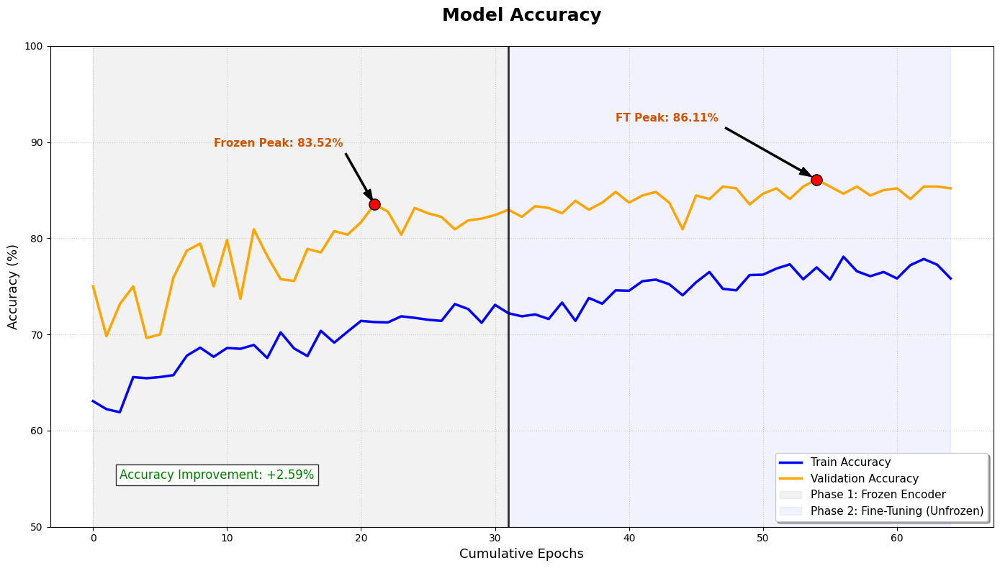

In [ ]:
path_v2 = os.path.join(REPO_PATH, 'Final_Training_Classifier_MLP_V2', "clf_mlp_v2_history.json")
path_ft = os.path.join(REPO_PATH, 'Final_Training_FineTuning_MLP', "clf_ft_history.json")

with open(path_v2, 'r') as f:
    h_v2 = json.load(f)
with open(path_ft, 'r') as f:
    h_ft = json.load(f)

val_acc_total = h_v2['val_acc'] + h_ft['val_acc']
train_acc_total = h_v2['train_acc'] + h_ft['train_acc']
split_point = len(h_v2['val_acc'])

frozen_peak = max(h_v2['val_acc'])
frozen_peak_idx = h_v2['val_acc'].index(frozen_peak)

ft_peak = max(h_ft['val_acc'])
ft_peak_idx_global = split_point + h_ft['val_acc'].index(ft_peak)

plt.figure(figsize=(14, 8), dpi=100)

plt.plot(train_acc_total, label='Train Accuracy', color='blue', linewidth=2.5)
plt.plot(val_acc_total, label='Validation Accuracy', color='orange', linewidth=2.5)

plt.axvline(x=split_point - 1, color='black', linestyle='-', linewidth=2, alpha=0.8)
plt.axvspan(0, split_point - 1, color='gray', alpha=0.1, label='Phase 1: Frozen Encoder')
plt.axvspan(split_point - 1, len(val_acc_total)-1, color='blue', alpha=0.05, label='Phase 2: Fine-Tuning (Unfrozen)')

plt.scatter(frozen_peak_idx, frozen_peak, color='red', s=120, edgecolors='black', zorder=5)
plt.annotate(f'Frozen Peak: {frozen_peak:.2f}%',
             xy=(frozen_peak_idx, frozen_peak),
             xytext=(frozen_peak_idx - 12, frozen_peak + 6),
             arrowprops=dict(facecolor='black', shrink=0.05, width=1.5, headwidth=8),
             fontsize=11, fontweight='bold', color='#D35400')

plt.scatter(ft_peak_idx_global, ft_peak, color='red', s=120, edgecolors='black', zorder=5)
plt.annotate(f'FT Peak: {ft_peak:.2f}%',
             xy=(ft_peak_idx_global, ft_peak),
             xytext=(ft_peak_idx_global - 15, ft_peak + 6),
             arrowprops=dict(facecolor='black', shrink=0.05, width=1.5, headwidth=8),
             fontsize=11, fontweight='bold', color='#D35400')

plt.title('Model Accuracy', fontsize=18, fontweight='bold', pad=25)
plt.xlabel('Cumulative Epochs', fontsize=13)
plt.ylabel('Accuracy (%)', fontsize=13)
plt.ylim(50, 100)
plt.grid(True, which='both', linestyle=':', alpha=0.6)
plt.legend(loc='lower right', frameon=True, shadow=True, fontsize=11)

gain = ft_peak - frozen_peak
plt.text(2, 55, f"Accuracy Improvement: +{gain:.2f}%",
         bbox=dict(facecolor='white', alpha=0.8), fontsize=12, color='green')

plt.tight_layout()
plt.show()

### **Accuracy Evolution**

The above chart illustrates the accuracy trajectory. The black vertical line represents the point (Epoch 32), where the Encoder was unfrozen and the learning rate was reduced to $10^{-5}$.

We can clearly observe two distinct plateaus. The first, in the Frozen Phase, stabilizes around $83.52$%. After the transition to Fine-Tuning, the model does not simply fluctuate; it actively searches for a new equilibrium, successfully breaking the previous ceiling to reach the global peak of $86.11$%. This further step confirms that the model was previously limited by its fixed feature extractor.

In the second half of the graph (Fine-Tuning), the curve becomes noticeably smoother. This is the direct result of the Learning Rate ($10^{-5}$). While Phase 1 shows more aggressive oscillations as the MLP head tries to align with static features, Phase 2 represents a more refined, incremental optimization where the entire pipeline is gently specialized.

The net accuracy gain of +$2.59$% was achieved in just 23 additional epochs. This high efficiency justifies the initial 32 epochs of "Frozen" training: by the time we unfroze the Encoder, the Classifier was already mature, preventing the noisy gradients of an untrained head from corrupting the pre-trained convolutional filters.

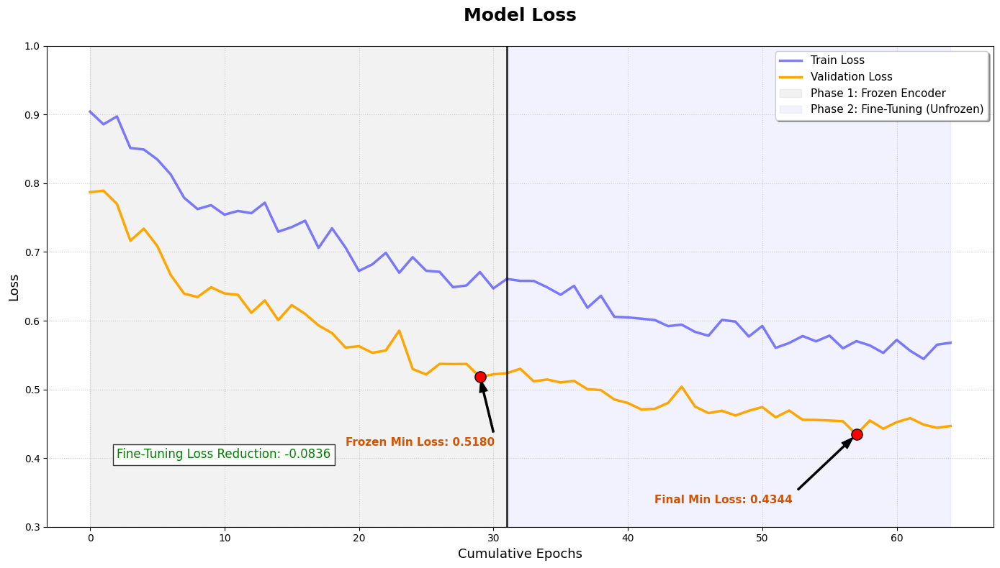

In [ ]:
val_loss_total = h_v2['val_loss'] + h_ft['val_loss']
train_loss_total = h_v2['train_loss'] + h_ft['train_loss']
split_point = len(h_v2['val_loss'])

frozen_min = min(h_v2['val_loss'])
frozen_min_idx = h_v2['val_loss'].index(frozen_min)

ft_min = min(h_ft['val_loss'])
ft_min_idx_global = split_point + h_ft['val_loss'].index(ft_min)

plt.figure(figsize=(14, 8), dpi=100)

plt.plot(train_loss_total, label='Train Loss', color='blue', linewidth=2.5, alpha=0.5)
plt.plot(val_loss_total, label='Validation Loss', color='orange', linewidth=2.5)

plt.axvline(x=split_point - 1, color='black', linestyle='-', linewidth=2, alpha=0.8)
plt.axvspan(0, split_point - 1, color='gray', alpha=0.1, label='Phase 1: Frozen Encoder')
plt.axvspan(split_point - 1, len(val_loss_total)-1, color='blue', alpha=0.05, label='Phase 2: Fine-Tuning (Unfrozen)')

plt.scatter(frozen_min_idx, frozen_min, color='red', s=120, edgecolors='black', zorder=5)
plt.annotate(f'Frozen Min Loss: {frozen_min:.4f}',
             xy=(frozen_min_idx, frozen_min),
             xytext=(frozen_min_idx - 10, frozen_min - 0.1), # Testo spostato verso il basso
             arrowprops=dict(facecolor='black', shrink=0.05, width=1.5, headwidth=8),
             fontsize=11, fontweight='bold', color='#D35400')

plt.scatter(ft_min_idx_global, ft_min, color='red', s=120, edgecolors='black', zorder=5)
plt.annotate(f'Final Min Loss: {ft_min:.4f}',
             xy=(ft_min_idx_global, ft_min),
             xytext=(ft_min_idx_global - 15, ft_min - 0.1), # Testo spostato verso il basso
             arrowprops=dict(facecolor='black', shrink=0.05, width=1.5, headwidth=8),
             fontsize=11, fontweight='bold', color='#D35400')

plt.title('Model Loss', fontsize=18, fontweight='bold', pad=25)
plt.xlabel('Cumulative Epochs', fontsize=13)
plt.ylabel('Loss', fontsize=13)

plt.ylim(0.3, 1.0)
plt.grid(True, which='both', linestyle=':', alpha=0.6)
plt.legend(loc='upper right', frameon=True, shadow=True, fontsize=11)

loss_reduction = frozen_min - ft_min
plt.text(2, 0.4, f"Fine-Tuning Loss Reduction: -{loss_reduction:.4f}",
         bbox=dict(facecolor='white', alpha=0.8), fontsize=12, color='green')

plt.tight_layout()
plt.show()

### **Loss Evolution**

Complementing the accuracy analysis, the evolution of the Cross-Entropy Loss provides a deeper look into the optimization quality. The loss curve represents the model's confidence and the mathematical error it minimizes during training.

Consistent with the accuracy plots, we observe that the Validation Loss is consistently lower than the Training Loss.

During the Frozen Phase, the validation loss reached a minimum of $0.5180$. However, the curve eventually began to flatten, indicating that the MLP head had exhausted its ability to minimize error using static features. Upon entering the Fine-Tuning Phase, the loss curve immediately shows a renewed downward trajectory. The global minimum loss of $0.4344$ (achieved at global epoch 58) demonstrates that unfreezing the encoder allowed the model to find a significantly better local minimum in the weight space.

The transition to an unfrozen encoder led to a total loss reduction of $0.0836$. While this might seem like a small numerical shift, in the context of Cross-Entropy, it represents a substantial increase in the model's probabilistic certainty. The model is not just getting more labels correct (Accuracy); it is becoming more mathematically certain about its correct predictions and less confused by difficult samples.

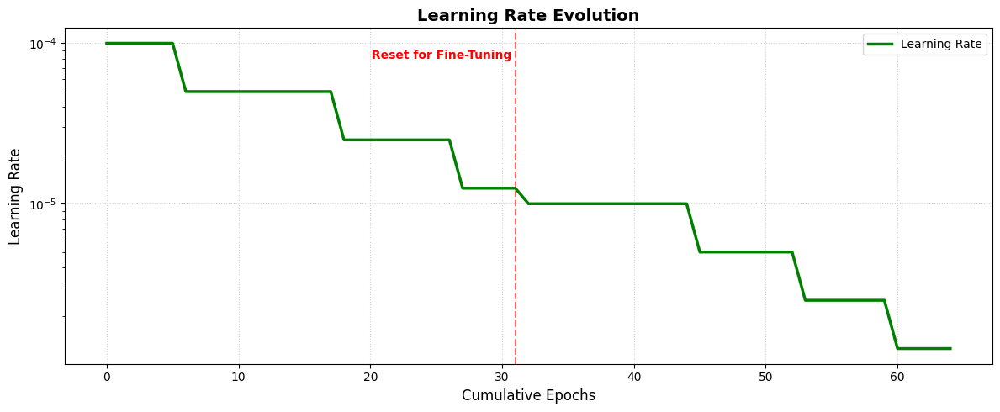

In [ ]:
total_lr = h_v2['lr_evolution'] + h_ft['lr_evolution']
split_point = len(h_v2['lr_evolution'])

plt.figure(figsize=(12, 5))
plt.plot(total_lr, color='green', linewidth=2.5, label='Learning Rate')

plt.axvline(x=split_point - 1, color='red', linestyle='--', alpha=0.6)
plt.text(split_point - 1, max(total_lr)*0.8, ' Reset for Fine-Tuning ',
         color='red', fontweight='bold', ha='right')

plt.yscale('log')
plt.grid(True, linestyle=':', alpha=0.6)
plt.title('Learning Rate Evolution', fontsize=14, fontweight='bold')
plt.xlabel('Cumulative Epochs', fontsize=12)
plt.ylabel('Learning Rate', fontsize=12)

plt.legend()

plt.tight_layout()
plt.show()

### **Learning Rate Evolution**

The Learning Rate trajectory serves as the control log of our optimization, transitioning from high-dimensional exploration to microscopic refinement.

On the left, the rapid succession of downward steps illustrates the `ReduceLROnPlateau` scheduler actively managing the MLP head. Each $50\%$ decay indicates a transition where the optimizer, having exhausted the potential of a specific step size, was forced to refine its weight updates to extract deeper patterns from the static latent features.

The vertical red line marks the implementation of a warm Reset at $10^{-5}$. This specific order of magnitude was chosen to provide enough energy for the Encoder to begin its supervised specialization while remaining gentle enough to preserve the textural knowledge gained during the 179-epoch unsupervised pre-training.

Post reset, the evolution becomes noticeably smoother. With the Encoder unfrozen, the model was no longer fighting a restricted feature space; instead, the entire pipeline adapted in unison. The final decays toward the $10^{-6}$ floor represent the surgical precision required to navigate the final local minima and secure our global accuracy peak of $86.11$%.

## **Test Evaluation**

Having confirmed the stability of the training process and the successful convergence of the global fine-tuning phase, we now proceed with a comprehensive evaluation of the final model. To ensure a strictly unbiased assessment of the network's real-world generalization capabilities, all subsequent metrics and qualitative analyses are computed exclusively on the unseen test set.

To maintain methodological consistency with the Custom ResNet-18 Model, the evaluation is structured using the same three complementary steps:

* **Confusion Matrix**: This provides a detailed view of class-wise performance, highlighting potential misclassification patterns and textural overlaps among visually similar leather defect categories on completely new data.
* **Classification Report**: By including precision, recall, and F1-score for each of the six classes, this report allows for a direct comparison of the discriminative power of the learned latent features against the supervised ResNet-18 baseline.
* **Inference Gallery**: A qualitative visual inspection of a random subset of test images, offering an intuitive understanding of the model’s strengths and remaining weaknesses in identifying defects on the leather surface.

This mirrored approach ensures that the performance of the hybrid Autoencoder-MLP pipeline is evaluated through the same lens as the standard supervised architecture, allowing for a transparent comparison of their respective classification behaviors.

## **Confusion Matrix**

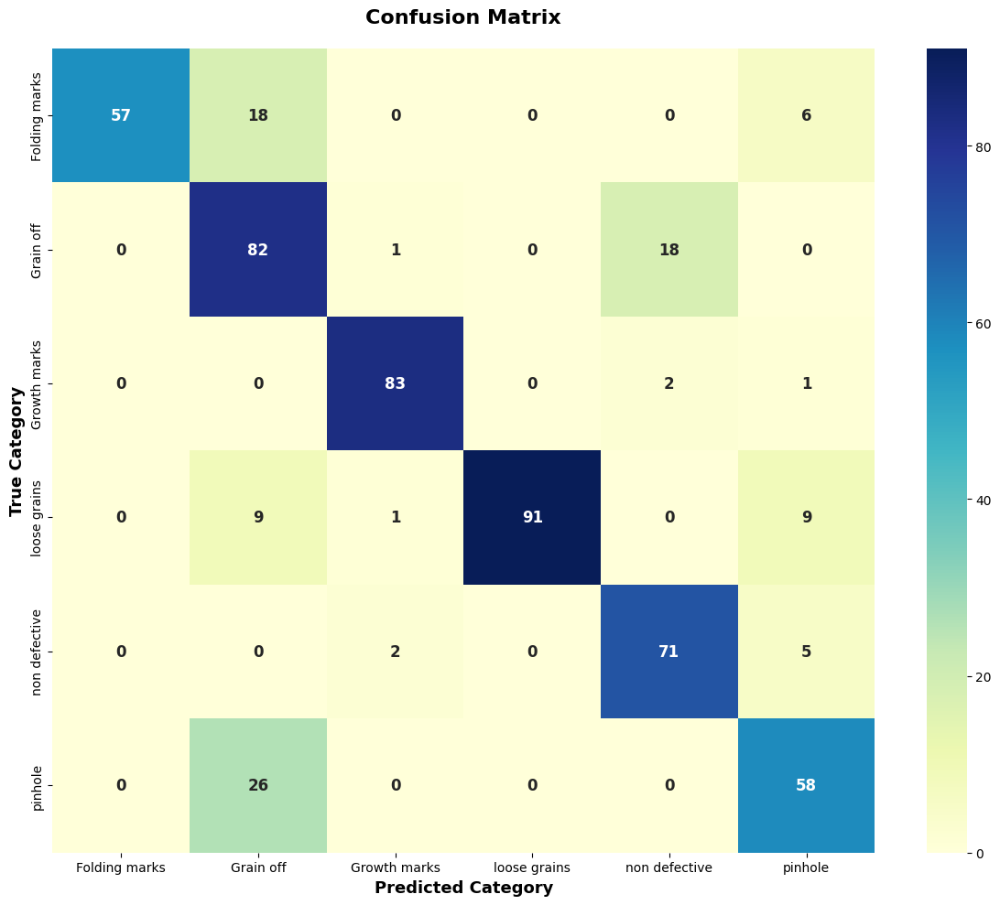

In [ ]:
model_ft = LeatherMLPClassifier_v2(base_ae.encoder, num_classes=6).to(device)

path_ft_final = os.path.join(REPO_PATH, 'Final_Training_FineTuning_MLP', "CLF_FINETUNED_OPTIMAL.pth")

model_ft.load_state_dict(torch.load(path_ft_final, map_location=device))
model_ft.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        outputs = model_ft(inputs)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

class_names = dataset.classes

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(12, 10), dpi=100)
sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu',
            xticklabels=class_names, yticklabels=class_names,
            annot_kws={"size": 12, "weight": "bold"})

plt.title('Confusion Matrix', fontsize=16, fontweight='bold', pad=20)
plt.ylabel('True Category', fontsize=13, fontweight='bold')
plt.xlabel('Predicted Category', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

The visual distribution of predictions within the Confusion Matrix for the Fine-Tuned Autoencoder-MLP pipeline reveals a robust classification structure. The strong concentration of samples along the main diagonal confirms that the latent representations, once specialized through global fine-tuning, retain a high degree of discriminative information.

### **High-Performing Classes**

Several categories demonstrate exceptional reliability, proving that the Encoder effectively preserves their unique morphological signatures:

* *Loose grains*: This class shows the strongest performance ($91$ correct predictions), indicating that its irregular, wide area texture remains highly distinguishable even in a compressed latent space.
* *Growth marks*: Classified with high accuracy ($83$ correct predictions), confirming that the elongated structural patterns of these defects are successfully captured and mapped.
* *Grain off*: Despite being a complex category, it performs well ($82$ correct predictions). It is worthy to underline that *Grain off* shows signs of overlap with the *non defective* class, in contrast to the results obtained during the test evaluation of the Custom ResNet-18 Model.

### **Areas of Textural Overlap**

The misclassifications follow a pattern that is morphologically coherent with the visual nature of leather:

* *Grain off* / *pinhole* / *Folding marks*: As observed in the ResNet-18 baseline, Grain Off remains a central attractor for errors. Specifically, $26$ Pinhole samples and $18$ Folding Marks were misclassified as Grain Off. This confirms that dense clusters of punctures or sharp creases generate high-frequency spatial gradients that the model occasionally perceives as the roughened surface typical of Grain Off.
* Additional minor overlaps appear between *Folding marks* and *pinhole* ($6$ cases), and *loose grains* with both *Grain off* and *pinhole* ($9$ cases each). These errors suggest that in a compressed feature space, these defects share similar spatial intensities.

## **Classification Report**

In [ ]:
report_dict = classification_report(all_labels, all_preds,
                                    target_names=class_names, output_dict=True)

accuracy_val = report_dict.pop('accuracy')

df_report = pd.DataFrame(report_dict).transpose()
df_report['support'] = df_report['support'].astype(int)

styled_report = (
    df_report.style
    .set_caption(f"Classification Report")
    .format({
        'precision': '{:.2f}',
        'recall': '{:.2f}',
        'f1-score': '{:.2f}',
        'support': '{:d}'
    })
    .background_gradient(cmap='YlGnBu', subset=['precision', 'recall', 'f1-score'],
                         vmin=0.0, vmax=1.0)
    .set_table_styles([
        {'selector': 'caption', 'props': [('color', 'black'), ('font-size', '16px'), ('font-weight', 'bold'), ('margin-bottom', '15px')]},
        {'selector': 'th', 'props': [('background-color', '#f2f2f2'), ('color', 'black'), ('border', '1px solid #ccc'), ('text-align', 'center')]},
        {'selector': 'td', 'props': [('border', '1px solid #eee'), ('padding', '8px')]}
    ])
)

# Visualizzazione del risultato
print(f"Global Accuracy: {accuracy_val:.2%}\n")
styled_report

Global Accuracy: 81.85%



,precision,recall,f1-score,support
Folding marks,1.00,0.70,0.83,81
Grain off,0.61,0.81,0.69,101
Growth marks,0.95,0.97,0.96,86
loose grains,1.00,0.83,0.91,110
non defective,0.78,0.91,0.84,78
pinhole,0.73,0.69,0.71,84
macro avg,0.85,0.82,0.82,540
weighted avg,0.85,0.82,0.82,540


The Autoencoder-based model achieved a Global Accuracy of $81.85$% on the unseen test set. While this represents an excellent level of performance for a hybrid architecture, comparing it with the Custom ResNet-18 ($88.89$%) reveals how the nature of the extracted features influences surgical precision across the different defect classes.

### **Growth Marks and Loose Grains**

The model demonstrates exceptional classification capabilities for *Growth marks* and *Loose grains*, achieving F1-scores of 0.96 and 0.91, respectively.

* *Growth marks:* With a Recall of $0.97$ and a Precision of $0.95$, this class is the most successfully represented in the latent space. Unlike the ResNet-18 (F1-score $0.98$), the hybrid model loses almost nothing in terms of discriminative capacity, confirming that the elongated, linear morphology of these defects was perfectly captured during the unsupervised pre-training phase.
* *Loose grains:* This category achieved a perfect Precision ($1.00$), even surpassing the ResNet-18 in terms of specificity. However, the lower Recall ($0.83$ compared to the ResNet's $0.92$) indicates that, although the hybrid model is extremely specific, the supervised ResNet-18 is better at capturing the subtler variations of the relaxed skin texture.

### **Grain Off and Folding Marks**

The metrics perfectly encapsulate the visual confusion previously observed in the Confusion Matrix, a phenomenon present in both models but accentuated in the hybrid pipeline:

* *Grain off:* This class shows a high Recall ($0.81$), but its Precision drops significantly to $0.61$. This is noticeably lower than the $0.71$ achieved by the ResNet-18. The hybrid model tends to use *Grain off* as a "topological sink", absorbing false positives from other defects (such as *Folding marks* and *pinholes*) that exhibit similar roughened surface textures.
* *Folding marks:* Conversely, we observe a mirrored behavior here. The hybrid model maintains a perfect Precision ($1.00$), exactly like the ResNet-18. However, the Recall stops at $0.70$ (compared to the ResNet's 0.73). Both models mis" about 30% of actual *Folding marks*, erroneously classifying them under the visually broader *Grain off* category, but the hybrid model is slightly more prone to this morphological confusion.

### **Pinhole and Non Defective**

* *pinhole:* This class proved to be the most significant challenge for the Autoencoder-based features, recording an F1-score of $0.71$. The comparison with the ResNet-18 (F1-score $0.73$) shows a minimal gap, confirming that distinguishing tiny puncture marks from the high-frequency noise of natural leather is a structural limit of the dataset, regardless of the architecture used.
* *Non defective:* The hybrid model maintains a solid Recall of 0.91, but the Precision ($0.78$) is noticeably lower than the almost perfect $0.97$ of the ResNet-18. This suggests that while the ResNet learned to actively ignore almost all natural skin irregularities, the Autoencoder, having been designed to reconstruct every detail, tends to be too sensitive, occasionally interpreting the natural grain of healthy leather as a potential defect.

While the Custom ResNet-18 dominates with a Macro F1-score of $0.89$, the hybrid model achieves a very respectable $0.82$.
The 7% gap in Global Accuracy between the two approaches is not a failure of the hybrid model, but rather a demonstration of the "cost" of relying on a compressed representation. The ResNet-18, having been trained end-to-end with labels from day one, developed specific filters to discard noise. The Autoencoder-based model, despite reaching an impressive discriminative maturity, suffers from its "reconstructive" heritage: it retains a textural sensitivity that sometimes blurs the boundaries between highly similar classes like *Grain off* and *Non defective*.

## **Inference Gallery**

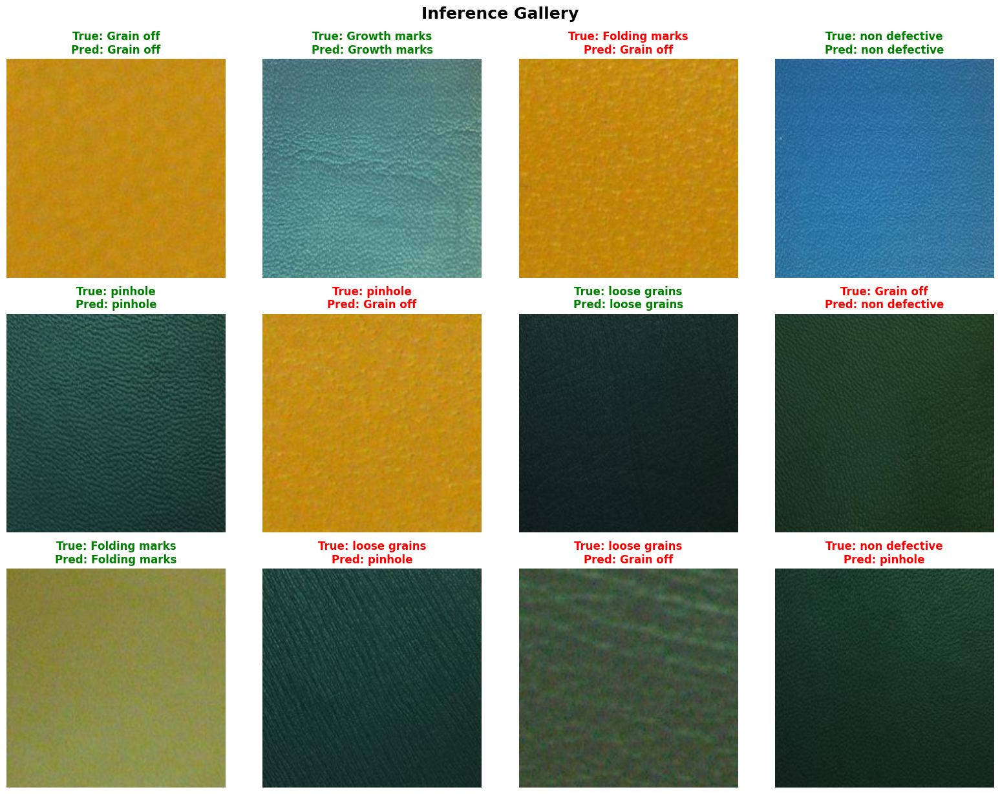

In [ ]:
model_ft.eval()

correct_found = {c: 0 for c in class_names}

errors_to_find = [
    ('Grain off', 'non defective'),
    ('loose grains', 'Grain off'),
    ('non defective', 'pinhole'),
    ('Folding marks', 'Grain off'),
    ('pinhole', 'Grain off'),
    ('loose grains', 'pinhole')
]

found_images = []

with torch.no_grad():
    for image, label in test_loader.dataset:
        if len(found_images) == 12:
            break

        true_class = class_names[label]

        input_tensor = image.unsqueeze(0).to(device)
        output = model_ft(input_tensor)
        _, pred_idx = torch.max(output, 1)
        pred_class = class_names[pred_idx.item()]

        if true_class == pred_class and correct_found[true_class] < 1:
            found_images.append((image, true_class, pred_class, 'green'))
            correct_found[true_class] += 1

        elif true_class != pred_class:
            error_pair = (true_class, pred_class)
            if error_pair in errors_to_find:
                found_images.append((image, true_class, pred_class, 'red'))
                errors_to_find.remove(error_pair)

plt.figure(figsize=(16, 12), dpi=100)

for i, (image, true_c, pred_c, color) in enumerate(found_images):
    img = image.cpu().numpy().transpose((1, 2, 0))
    img = np.clip(img, 0, 1)
    plt.subplot(3, 4, i+1)
    plt.imshow(img)
    title = f"True: {true_c}\nPred: {pred_c}"
    plt.title(title, color=color, fontsize=12, fontweight='bold')
    plt.axis('off')

plt.tight_layout()
plt.suptitle("Inference Gallery",
             fontsize=18, fontweight='bold', y=1.02)
plt.show()

To conclude the quantitative performance analysis, we carried out a qualitative inspection of the model’s predictions by constructing an **Inference Gallery**. This visualization allows us to directly observe how the latent features learned by the Autoencoder are translated into classification decisions.

For this evaluation, the network was set to evaluation mode (`model.eval()`) and gradient computation was disabled (`torch.no_grad()`). The gallery is organized as a $3 \times 4$ grid, following a selection strategy designed to highlight both the strengths and the weaknesses of the model through representative correct classifications and targeted misclassification cases.

### **Correct Classifications**

Six images in the gallery (highlighted in green) correspond to correctly predicted samples, one for each class. These examples confirm that the latent representation produced by the Encoder successfully preserves the structural information necessary to capture the most relevant visual characteristics:

* *Grain off* and *Growth mark*s: These categories exhibit recognizable surface patterns and elongated textures that the model successfully maps to their respective labels.
* *loose grain*s: The distinctive irregular and wavy texture of this defect remains sufficiently separable and identifiable within the learned feature space.
* *pinhole* and *Folding marks*: When these defects are spatially well-defined, the model correctly identifies them, proving that the fine-tuning phase effectively sharpened the Encoder’s sensitivity to these anomalies.
* *non defective*: The model correctly interprets uniform and homogeneous textures as the absence of surface anomalies.

These successful predictions demonstrate that the Encoder manages to retain meaningful visual cues, even though it was originally optimized for a reconstruction objective rather than a purely discriminative one.

### **Misclassifications**

The remaining six samples (highlighted in red) illustrate representative error scenarios that validate the confusion patterns previously observed in the Classification Report:

* "Grain off*: As expected, *Grain off* acts as a frequent destination for visually ambiguous textures. Both *pinhole* and *Folding marks* samples are misclassified as *Grain off* when they lack a strong structural signature (e.g., when *pinholes* are too shallow or *Folding marks* lack a clear directional crease).
* *Loose grains vs. pinhole*: An informative error occurs when *Loose grains* are predicted as *pinhole*. In the example, the undulating surface of loose skin creates localized shadows. Within the compressed latent representation, these high-contrast spots mimic the circular depressions associated with *pinhole* defects.
* *Grain off vs. non defective*: A specific limitation of the Autoencoder’s representation is revealed when subtle *Grain off* erosion is classified as *non defective*. If the surface appears relatively smooth, the Encoder may treat it as structurally similar to a healthy sample, leading the classifier to miss the defect.

Overall, the Inference Gallery confirms that the autoencoder-based classifier learns a consistent representation of leather surface textures. However, compared to the fully supervised ResNet-18 architecture, the separation between certain categories appears slightly less pronounced. Since the autoencoder is optimized to capture the overall structure of the images for reconstruction, rather than explicitly maximize class separability, the resulting latent space may group together defects that share similar micro-textural properties. Consequently, most classification mistakes arise between categories with strong visual similarities, particularly those involving Grain off, Pinhole, and Folding marks.

# **Final Conclusions**

### **Supervised Learning vs. Reconstructive Transfer Learning**

The fundamental difference between our two approaches lies in how the feature space is constructed. In the fully supervised Custom ResNet-18, the network is trained end-to-end with explicit labels. The convolutional filters immediately learn to isolate discriminative features (e.g., a scratch) while actively discarding irrelevant background information (e.g., natural skin pores).

Conversely, our hybrid approach relies on an Autoencoder whose primary objective during pre-training is pure reconstruction. The latent space is optimized to preserve every textural detail, including natural noise. When we transfer these frozen features to train a classifier, the MLP must navigate a highly dense, unstructured feature vector. While fine-tuning eventually aligns this latent space with the classification task, the model inherits a "reconstructive burden"—a heightened sensitivity to all morphological variations, not just the defective ones.

### **Performance Analysis**

This architectural divergence perfectly explains the performance gap observed in our testing phase. The Custom ResNet-18 achieved a Global Accuracy of $88.89$% and a Weighted F1-Score of $0.89$, establishing a robust baseline. The Autoencoder-based pipeline reached a Global Accuracy of $81.85$% and a Weighted F1-Score of $0.82$.

Crucially, these metrics must be evaluated against the core objective of our project: rather than simply relying on standard architectures specialized exclusively for classification, our goal was to demonstrate that a completely different paradigm, leveraging an unsupervised, reconstructive latent space, could yield highly interesting and competitive discriminative results.

From this perspective, the slight degradation in the hybrid model is not a failure, but a highly promising outcome of its textural sensitivity. As demonstrated in the per-class analysis, the Autoencoder perfectly matches the ResNet on geometrically distinct defects (like *Growth marks*, achieving a $0.96$ F1-score). However, it struggles with ambiguous boundaries, frequently confusing *Grain off* with natural, *non defective* leather anomalies. The supervised model simply learned to ignore these subtle natural variations, whereas the Autoencoder, by design, retained them, leading to a higher rate of false positives in highly similar classes.

### **Critical Constraints**

Moving from a controlled dataset to real-world industrial application introduces severe challenges. Leather is a highly variable organic material; factors such as animal origin, tanning processes, dyeing colors, and even ambient factory lighting drastically alter its visual appearance.

The primary critical issue for our models is domain shift and generalization. Training a model on a specific batch of leather does not guarantee it will perform equally well on a different product line. Furthermore, acquiring a dataset large enough to cover this infinite natural variance is prohibitively expensive. In the industrial sector, defective samples are naturally rare compared to healthy ones, and pixel-perfect manual annotation requires highly specialized domain experts, creating a massive bottleneck for scalable deployment.


# **References**

- Bengio, Y. (2012).Deep learning of representations for unsupervised and transfer learning. In *Proceedings of ICML Workshop on Unsupervised and Transfer Learning*. JMLR Workshop and Conference Proceedings.

- Erhan, D., Bengio, Y., Courville, A., Manéval, P.-A., Vincent, P., & Bengio, S. (2010). Why does unsupervised pre-training help deep learning? *Journal of Machine Learning Research*.

- *ResNet18 from scratch using PyTorch*. Retrieved from [https://www.geeksforgeeks.com/deep-learning/resnet18-from-scratch-using-pytorch/](https://www.geeksforgeeks.com/deep-learning/resnet18-from-scratch-using-pytorch/)

- Goodfellow, I., Bengio, Y., & Courville, A. (2016). Autoencoders (Chapter 14). In *Deep Learning*. MIT Press.

- Pan, S. J., & Yang, Q. (2010). A survey on transfer learning. *IEEE Transactions on Knowledge and Data Engineering*.

- Wang, Z., Bovik, A. C., Sheikh, H. R., & Simoncelli, E. P. (2004). Image quality assessment: from error visibility to structural similarity. *IEEE Transactions on Image Processing*.

- Yosinski, J., Clune, J., Bengio, Y., & Lipson, H. (2014). How transferable are features in deep neural networks? In *Advances in Neural Information Processing Systems* (NIPS).

- Zhang, A., Lipton, Z. C., Li, M., & Smola, A. J. (2023). *Dive into Deep Learning*. Cambridge University Press.

- Zhao, H., Gallo, O., Frosio, I., & Kautz, J. (2017). Loss functions for image restoration with neural networks. *IEEE Transactions on Computational Imaging*.




